# Load Data

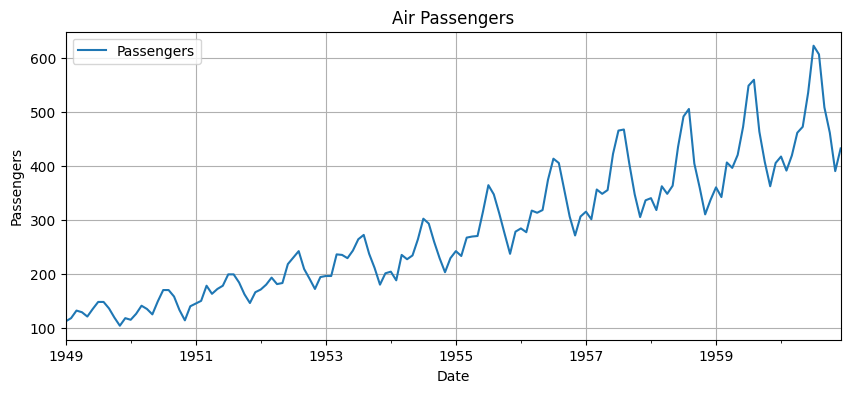

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import warnings

warnings.filterwarnings("ignore")


# Load the AirPassengers dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/airline-passengers.csv"
df = pd.read_csv(url, parse_dates=['Month'], index_col='Month')

# Visualize the series
df.plot(figsize=(10, 4), title="Air Passengers")
plt.xlabel("Date")
plt.ylabel("Passengers")
plt.grid()
plt.show()

# Split Data

In [2]:
def create_time_series_features(data, lookback_window=12):
    """
    Create features for time series forecasting using lagged values
    """
    X, y = [], []
    
    for i in range(lookback_window, len(data)):
        # Use previous 'lookback_window' values as features
        X.append(data[i-lookback_window:i])
        y.append(data[i])
    
    return np.array(X), np.array(y)

In [3]:
lag = 12
X = df['Passengers'][:-lag]
y = df['Passengers'][lag:]

# Define sizes
n = len(X)
train_size = int(n * 0.7)
val_size = int(n * 0.15)
test_size = n - train_size - val_size

# Split the series
data = {
    'X_train': X[:train_size],
    'y_train': y[:train_size],
    'X_val': X[train_size:train_size + val_size],
    'y_val': y[train_size:train_size + val_size],
    'X_test': X[train_size + val_size:],
    'y_test': y[train_size + val_size:]
}

# Confirm sizes
print(f"Train size: {len(data['X_train'])}, Val size: {len(data['X_val'])}, Test size: {len(data['X_test'])}")

Train size: 92, Val size: 19, Test size: 21


In [4]:
from sklearn.preprocessing import StandardScaler

# Scale the features
scaler_X = StandardScaler()
scaler_y = StandardScaler()

data['X_train_scaled'] = scaler_X.fit_transform(np.array(data['X_train']).reshape(-1,1))
data['X_val_scaled'] = scaler_X.transform(np.array(data['X_val']).reshape(-1,1))
data['y_train_scaled'] = scaler_y.fit_transform(np.array(data['y_train']).reshape(-1, 1)).ravel()
data['y_val_scaled'] = scaler_y.transform(np.array(data['y_val']).reshape(-1, 1)).ravel()
# X_test_scaled = 
# y_test_scaled = 


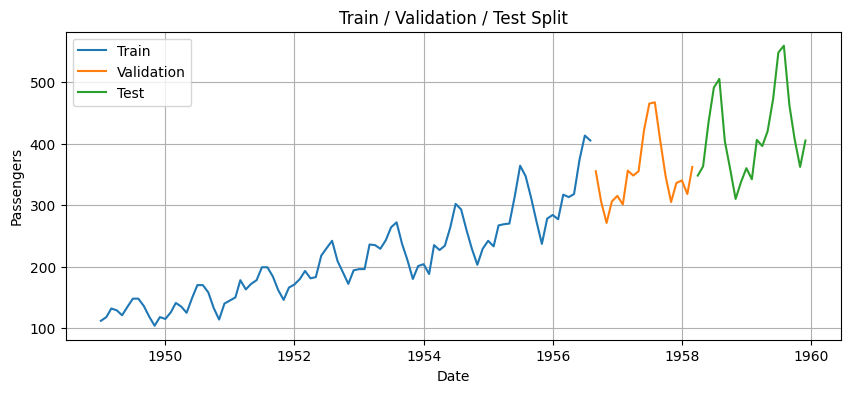

In [5]:
plt.figure(figsize=(10, 4))
plt.plot(data['X_train'], label="Train")
plt.plot(data['X_val'], label="Validation")
plt.plot(data['X_test'], label="Test")
plt.title("Train / Validation / Test Split")
plt.xlabel("Date")
plt.ylabel("Passengers")
plt.legend()
plt.grid()
plt.show()

# Base Models

In [6]:
from abc import ABC, abstractmethod
from statsmodels.tsa.arima.model import ARIMA
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from copy import deepcopy

class AbstractBaseModel (ABC):

    def __init__(self, model, hparams, *args, **kwagrs):
        self.model = model
        self.hparams = hparams
        self.fitness_score = 0.0
        self.forecast = None

    @abstractmethod
    def train(self, X_train, y_train):
        raise NotImplementedError("Subclasses must implement train method")

    @abstractmethod
    def predict(self, X_test):
        raise NotImplementedError("Subclasses must implement predict method")

    @abstractmethod
    def get_name(self):
        raise NotImplementedError("Subclasses must implement get_name method")
    
    @abstractmethod
    def crossover(self, other):
        raise NotImplementedError("Subclasses must implement crossover method")

    @abstractmethod
    def mutate(self):
        raise NotImplementedError("Subclasses must implement mutate method")
    
    def calculate_fitness(self, pred, y_test, diversity_score):
        alpha = 0.9
        beta = 0.1
        self.fitness_score = (alpha * 1/(np.sqrt(mean_squared_error(y_test, pred)) + 1e-8)) + (beta * diversity_score)
        return self.fitness_score
    
    def __str__(self):
        return str(type(self).__name__) + ' ' + str(self.hparams) + ' Fitness: ' + str(self.fitness_score)
    
    def __repr__(self):
        return str(type(self).__name__) + ' ' + str(self.hparams) + ' Fitness: ' + str(self.fitness_score)


class ArimaModel(AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
    
    def train(self, X_train, y_train):
        p = self.hparams['p']
        d = self.hparams['d']
        q = self.hparams['q']
        self.model = ARIMA(X_train, order=(p, d, q)).fit()
    
    def predict(self, X_test):
        self.forecast = self.model.forecast(steps=len(X_test))
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'arima'
    
    def crossover(self, other):
        if not isinstance(other, ArimaModel):
            raise ValueError("Can only crossover with another ArimaModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            child1.hparams['p'], child2.hparams['p'] = child2.hparams['p'], child1.hparams['p']
        if np.random.random() < 0.5:
            child1.hparams['d'], child2.hparams['d'] = child2.hparams['d'], child1.hparams['d']
        if np.random.random() < 0.5:
            child1.hparams['q'], child2.hparams['q'] = child2.hparams['q'], child1.hparams['q']
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['p', 'd', 'q'])
        
        if mutation_param == 'p':
            self.hparams['p'] = np.random.randint(0, 5)
        elif mutation_param == 'd':
            self.hparams['d'] = np.random.randint(0, 2)
        elif mutation_param == 'q':
            self.hparams['q'] = np.random.randint(0, 5)
        
        self.fitness_score = 0.0
        
        return self

class SVRModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        kernel = self.hparams['kernel']
        c = self.hparams['c']
        gamma = self.hparams['gamma']
        epsilon = self.hparams['epsilon']
        self.model = SVR(kernel=kernel, C=c, gamma=gamma, epsilon=epsilon)
        self.model.fit(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = self.model.predict(X_test)
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'svr'
    
    def crossover(self, other):
        if not isinstance(other, SVRModel):
            raise ValueError("Can only crossover with another SVRModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            child1.hparams['kernel'], child2.hparams['kernel'] = child2.hparams['kernel'], child1.hparams['kernel']
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            c1, c2 = child1.hparams['c'], child2.hparams['c']
            child1.hparams['c'] = alpha * c1 + (1 - alpha) * c2
            child2.hparams['c'] = alpha * c2 + (1 - alpha) * c1
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            eps1, eps2 = child1.hparams['epsilon'], child2.hparams['epsilon']
            child1.hparams['epsilon'] = alpha * eps1 + (1 - alpha) * eps2
            child2.hparams['epsilon'] = alpha * eps2 + (1 - alpha) * eps1
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['kernel', 'c', 'epsilon'])
        
        if mutation_param == 'kernel':
            self.hparams['kernel'] = np.random.choice(["linear", "rbf", "poly"])
        
        elif mutation_param == 'c':
            current_c = self.hparams['c']
            noise = np.random.normal(0, current_c * 0.1)  # 10% noise
            self.hparams['c'] = max(0.1, min(100, current_c + noise))
        
        elif mutation_param == 'epsilon':
            current_eps = self.hparams['epsilon']
            noise = np.random.normal(0, current_eps * 0.1)  # 10% noise
            self.hparams['epsilon'] = max(0.001, min(0.5, current_eps + noise))

        self.fitness_score = 0.0
        
        return self
    
class MLPModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        hidden_layer_sizes = self.hparams['hidden_layer_sizes']
        learning_rate = self.hparams['learning_rate']
        
        hidden_layer_sizes = (int(hidden_layer_sizes),)
        
        self.model = MLPRegressor(hidden_layer_sizes=hidden_layer_sizes,
                            learning_rate_init=learning_rate,
                            max_iter=500, random_state=42)
        self.model.fit(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = self.model.predict(X_test)
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'mlp'
    
    def crossover(self, other):
        if not isinstance(other, MLPModel):
            raise ValueError("Can only crossover with another MLPModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            h1, h2 = child1.hparams['hidden_layer_sizes'], child2.hparams['hidden_layer_sizes']
            child1.hparams['hidden_layer_sizes'] = int(alpha * h1 + (1 - alpha) * h2)
            child2.hparams['hidden_layer_sizes'] = int(alpha * h2 + (1 - alpha) * h1)
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            lr1, lr2 = child1.hparams['learning_rate'], child2.hparams['learning_rate']
            child1.hparams['learning_rate'] = alpha * lr1 + (1 - alpha) * lr2
            child2.hparams['learning_rate'] = alpha * lr2 + (1 - alpha) * lr1
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['hidden_layer_sizes', 'learning_rate'])
        
        if mutation_param == 'hidden_layer_sizes':
            current_size = self.hparams['hidden_layer_sizes']
            change = np.random.randint(-10, 11)  # Change by -10 to +10
            self.hparams['hidden_layer_sizes'] = max(5, min(50, current_size + change))
        
        elif mutation_param == 'learning_rate':
            current_lr = self.hparams['learning_rate']
            noise = np.random.normal(0, current_lr * 0.1)  # 10% noise
            self.hparams['learning_rate'] = max(0.001, min(0.1, current_lr + noise))

        self.fitness_score = 0.0
        
        return self

    
class EnsembleModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        for model in self.hparams.keys():
            self.hparams[model].train(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = 0.0
        for model in self.hparams.keys():
            self.forecast += self.hparams[model].predict(X_test)
        self.forecast /= len(self.hparams.keys()) # Average of all predictions
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'ensemble'
    
    def crossover(self, other):
        return self, other
    
    def mutate(self):
        return self


# Model Diversity and Evaluation

In [7]:
def print_population(population):
    for model in population.keys():
        for individual in population[model]:
            print(individual)
    print('============================\n\n')


def init_population(population_size, pool_of_models):
    population = {}

    for model in pool_of_models:
        population[model.get_name()] = []
        if model is ArimaModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    ArimaModel(
                        ARIMA,
                        {
                            'p': np.random.randint(0, 5),
                            'd': np.random.randint(0, 2),
                            'q': np.random.randint(0, 5)
                        }
                    )
                )
        elif model is SVRModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    SVRModel(
                        SVR,
                        {
                            'kernel' : np.random.choice(["linear", "rbf", "poly"]),
                            'c' : np.random.uniform(0.1, 100),
                            'gamma': np.random.choice(['scale']),
                            'epsilon' : np.random.uniform(0.001, 0.5)
                        }
                    )
                )
        elif model is MLPModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    MLPModel(
                        MLPRegressor,
                        {
                            'hidden_layer_sizes': np.random.randint(5, 50),
                            'learning_rate': np.random.uniform(0.001, 0.1)
                        }
                    )
                )
    
    return population

In [8]:
from itertools import combinations, zip_longest


def individual_diversity(population, X_test):
    
    # Get predictions from all models
    model_predictions = {}
    model_names = []
    
    # print("Generating predictions from individual models...")
    for model in population.keys():
        model_names.append(model)
        model_predictions[model] = []
        for individual in population[model]:
            model_predictions[model].append(individual.predict(X_test))
    
    # Convert to numpy array for easier computation
    pred_matrix = [list(lst) for lst in zip_longest(*model_predictions.values(), fillvalue=None)]
    
    # Calculate pairwise disagreements using MSE
    n_rows, n_cols = np.shape(pred_matrix)[0:2]
    disagreement_matrix = np.zeros((n_rows, n_cols))

    for i in range(n_rows):  # For each model instance (row)
        for j in range(n_cols):  # For each model type (column)
            ref_pred = pred_matrix[i][j]
            mse_list = []
            for k in range(n_cols):
                if k != j:
                    comp_pred = pred_matrix[i][k]
                    mse = mean_squared_error(ref_pred, comp_pred)
                    mse_list.append(mse)
            disagreement_matrix[i][j] = np.mean(mse_list)
    
    return disagreement_matrix

In [9]:
def individual_evaluation_with_diversity(population, data):
    X_train = data['X_train_scaled']
    y_train = data['y_train_scaled']
    X_val = data['X_val_scaled']
    y_val = data['y_val_scaled']


    for model in population.keys():
        for individual in population[model]:
            individual.train(X_train, y_train)
            pred = individual.predict(X_val)
            # individual.calculate_fitness(pred, y_val)

    disagreement_matrix = individual_diversity(population, X_val)

    i = 0
    for model in population.keys():
        j = 0
        for individual in population[model]:
            pred = individual.predict(X_val)
            individual.calculate_fitness(pred, y_val, disagreement_matrix[j][i])
            j +=1
        i += 1


In [10]:
def individual_evaluation(population, data):
    X_train = data['X_train_scaled']
    y_train = data['y_train_scaled']
    X_val = data['X_val_scaled']
    y_val = data['y_val_scaled']


    for model in population.keys():
        for individual in population[model]:
            individual.train(X_train, y_train)
            pred = individual.predict(X_val)
            individual.calculate_fitness(pred, y_val)


In [11]:
from itertools import combinations


def calculate_model_diversity(models_dict, X_test):
    """
    Calculate disagreement measure (diversity) for ensemble models using MSE.
    
    Parameters:
    -----------
    models_dict : dict
        Dictionary with model names as keys and trained model objects as values
        Format: {'model_name': model_object, ...}
    X_test : array-like
        Test data for generating predictions
    
    Returns:
    --------
    float : Average disagreement measure across all model pairs
    dict : Dictionary with detailed diversity metrics and model predictions
    """
    
    if len(models_dict) < 2:
        raise ValueError("Need at least 2 models to calculate diversity")
    
    # Get predictions from all models
    model_predictions = {}
    model_names = []
    
    # print("Generating predictions from individual models...")
    for model_name, model_obj in models_dict.items():
        predictions = model_obj.predict(X_test)
        model_predictions[model_name] = predictions
        model_names.append(model_name)
        # print(f"  {model_name}: predictions generated")
    
    # Convert to numpy array for easier computation
    pred_matrix = np.column_stack([model_predictions[name] for name in model_names])
    n_models = len(model_names)
    
    # Calculate pairwise disagreements using MSE
    pairwise_disagreements = []
    disagreement_matrix = np.zeros((n_models, n_models))
    model_pairs = []
    
    # print("\nCalculating pairwise disagreements...")
    for i, j in combinations(range(n_models), 2):
        model_i = model_names[i]
        model_j = model_names[j]
        pred_i = pred_matrix[:, i]
        pred_j = pred_matrix[:, j]
        
        disagreement = mean_squared_error(pred_i, pred_j)
        pairwise_disagreements.append(disagreement)
        disagreement_matrix[i, j] = disagreement
        disagreement_matrix[j, i] = disagreement  # Symmetric matrix
        model_pairs.append((model_i, model_j))
        
        # print(f"  {model_i} vs {model_j}: MSE = {disagreement:.6f}")
    
    # Calculate overall diversity measure
    avg_disagreement = np.mean(pairwise_disagreements)
    
    # Additional diversity statistics
    diversity_stats = {
        'average_disagreement': avg_disagreement,
        'pairwise_disagreements': pairwise_disagreements,
        'disagreement_matrix': disagreement_matrix,
        'model_pairs': model_pairs,
        'min_disagreement': np.min(pairwise_disagreements),
        'max_disagreement': np.max(pairwise_disagreements),
        'std_disagreement': np.std(pairwise_disagreements),
        'n_pairs': len(pairwise_disagreements),
        'model_names': model_names,
        'individual_predictions': model_predictions
    }
    
    return avg_disagreement, diversity_stats

In [12]:
def plot_forecasts(models, actual):
    plt.figure(figsize=(10, 4))
    plt.plot(actual, label='Actual')
    for model in models:
        plt.plot(model.forecast, label= model.get_name())
    # plt.xlabel("Date")
    # plt.ylabel("Passengers")
    plt.grid()
    plt.legend()
    plt.show()


In [13]:
def team_evaluation(population, X_test, y_test):
    alpha = 0.8
    beta = 0.2

    best_models = {}
    # Select the best individual of each subpopulation
    for model in population.keys():
        best_ind = None
        for individual in population[model]:
            best_ind = individual if best_ind is None or individual.fitness_score > best_ind.fitness_score else best_ind
        
        best_models[best_ind.get_name()] = best_ind
    
    ensemble = EnsembleModel(None, best_models)
    pred = ensemble.predict(X_test)

    models = best_models.copy()
    models['ensemble'] = ensemble
    plot_forecasts(models.values(), y_test)

    diversity_score, _ = calculate_model_diversity(best_models, X_test)
    fitness_score = (alpha * (1/(np.sqrt(mean_squared_error(pred, y_test) + 1e-8)))) + (beta * diversity_score)

    return fitness_score, best_models, pred, ensemble


# Genetic Algorithm Operators

In [14]:
from copy import deepcopy


def tournament_selection(population, tournament_size=3):
    selected_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        population_size = len(model_list)
        selected_population[model_type] = []
        
        # Perform tournament selection to maintain population size
        for _ in range(population_size):
            # Randomly select tournament_size individuals
            tournament_indices = np.random.choice(population_size, 
                                                size=min(tournament_size, population_size), 
                                                replace=False)
            
            # Find the individual with highest fitness in the tournament
            best_individual = None
            best_fitness = -1
            
            for idx in tournament_indices:
                individual = model_list[idx]
                if individual.fitness_score > best_fitness:
                    best_fitness = individual.fitness_score
                    best_individual = individual
            
            # Add a deep copy to avoid reference issues
            selected_population[model_type].append(deepcopy(best_individual))
    
    return selected_population

In [15]:
def crossover(population, crossover_rate=0.8):
    new_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        population_size = len(model_list)
        new_population[model_type] = []
        
        # Process pairs of individuals
        for i in range(0, population_size - 1, 2):
            parent1 = model_list[i]
            parent2 = model_list[i + 1]
            
            # Decide whether to perform crossover
            if np.random.random() < crossover_rate:
                # Use the crossover method of the object
                child1, child2 = parent1.crossover(parent2)
                new_population[model_type].extend([child1, child2])
            else:
                # No crossover, just copy parents
                new_population[model_type].extend([deepcopy(parent1), deepcopy(parent2)])
        
        # Handle odd population size
        if population_size % 2 == 1:
            new_population[model_type].append(deepcopy(model_list[-1]))
    
    return new_population

In [16]:
def mutation(population, mutation_rate=0.2):
    mutated_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        mutated_population[model_type] = []
        
        for individual in model_list:
            # Decide whether to mutate this individual
            if np.random.random() < mutation_rate:
                # Use the mutate method of the object
                mutated_individual = individual.mutate()
                mutated_population[model_type].append(mutated_individual)
            else:
                # No mutation, just copy the individual
                mutated_population[model_type].append(deepcopy(individual))
    
    return mutated_population

# Cooperative CoEvolutional Algorithm

Initializing population...
Population created: 
ArimaModel {'p': 1, 'd': 0, 'q': 1} Fitness: 0.0
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 0.0
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 0.0
ArimaModel {'p': 2, 'd': 0, 'q': 4} Fitness: 0.0
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 0.0
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.0
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 0.0
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 0.0
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.0
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 0.0
SVRModel {'kernel': 'poly', 'c': 19.871494508806144, 'gamma': 'scale', 'epsilon': 0.24181413170479565} Fitness: 0.0
SVRModel {'kernel': 'poly', 'c': 21.940929562422387, 'gamma': 'scale', 'epsilon': 0.009111055815520634} Fitness: 0.0
SVRModel {'kernel': 'rbf', 'c': 21.696913126635526, 'gamma': 'scale', 'epsilon': 0.07943158382434505} Fitness: 0.0
SVRModel {'kernel': 'rbf', 'c': 89.02960291650496, 'gamma': 'scale', 'epsilon': 0.10639741349230243} Fitness: 0.0


/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 1, 'd': 0, 'q': 1} Fitness: 1.981263930974079
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 2.081654979270547
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.0775971614637856
ArimaModel {'p': 2, 'd': 0, 'q': 4} Fitness: 1.2149165914745292
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.056591017123008
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8387428500464976
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.627714972897715
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.236126045528045
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7965894402823867
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.087223420942677
SVRModel {'kernel': 'poly', 'c': 19.871494508806144, 'gamma': 'scale', 'epsilon': 0.24181413170479565} Fitness: 1.7627287134283862
SVRModel {'kernel': 'poly', 'c': 21.940929562422387, 'gamma': 'scale', 'epsilon': 0.009111055815520634} Fitness: 2.012110879605097
SVRModel {'kernel': 'rbf', 'c': 21.696913126635526, 'gamma': 'scale', 'epsilon': 0.07943158382434505} Fi

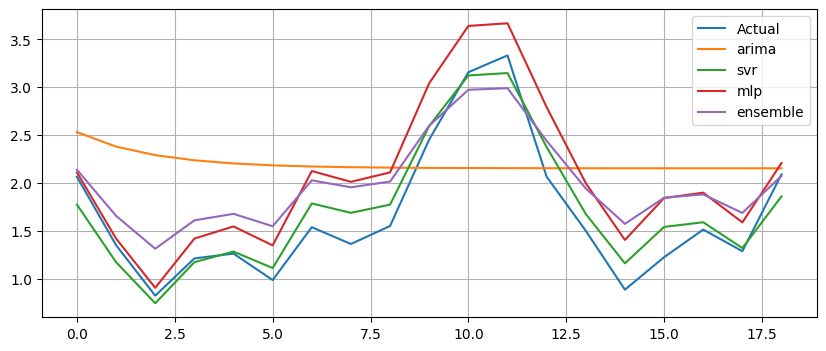

Generation 1: Fitness = 1.97022




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1654140049364732
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.077584969626263
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0757013257694858
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8295867334813842
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6325102533956457
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6258669524637244
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0736327356811315
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.2047034823466758
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1667450180727166
ArimaModel {'p': 1, 'd': 0, 'q': 2} Fitness: 1.061573744602705
SVRModel {'kernel': 'linear', 'c': 21.958363842377455, 'gamma': 'scale', 'epsilon': 0.4041991702391565} Fitness: 3.631332940467198
SVRModel {'kernel': 'linear', 'c': 69.59210415224564, 'gamma': 'scale', 'epsilon': 0.25762758372914435} Fitness: 2.7204843533103795
SVRModel {'kernel': 'linear', 'c': 59.596563796848876, 'gamma': 'scale', 'epsilon': 0.4682919619290

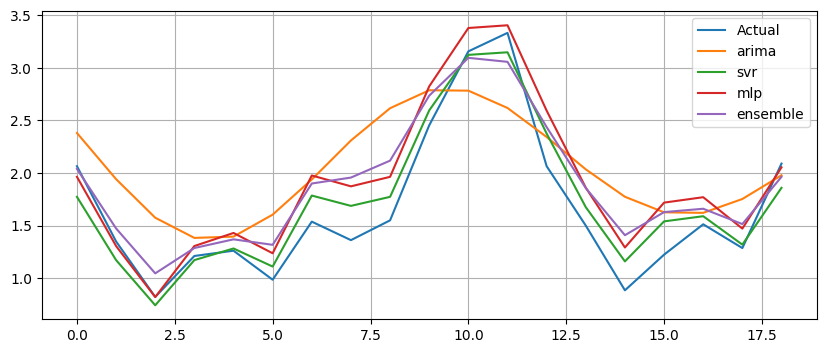

Generation 2: Fitness = 2.52445




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6798823339413582
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.163259501646447
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6272573533004935
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6280538513147593
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.627253792776995
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6272573533004935
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.084370419843378
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6273385749976716
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6263232800954053
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.160075629774196
SVRModel {'kernel': 'linear', 'c': 59.596563796848876, 'gamma': 'scale', 'epsilon': 0.4296420340199209} Fitness: 4.153276299681107
SVRModel {'kernel': 'linear', 'c': 59.596563796848876, 'gamma': 'scale', 'epsilon': 0.4456180504682186} Fitness: 4.412667911012045
SVRModel {'kernel': 'linear', 'c': 59.596563796848876, 'gamma': 'scale', 'epsilon': 0.4682919619290379

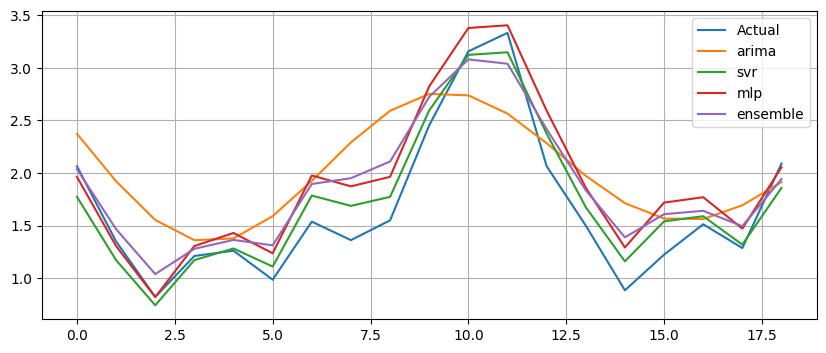

Generation 3: Fitness = 2.58783




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6795526379397192
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626899744551717
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6272573533004935
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6272573533004935
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0820891518611042
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1497176297342195
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6273385749976716
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6273385749976716
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.62700444862893
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6270639982768378
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.46829196192903794} Fitness: 4.468010772035275
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.4108703959678313} Fitness: 3.6694344966207417
SVRModel {'kernel': 'linear', 'c': 33.70776447302077, 'gamma': 'scale', 'epsilon': 0.4682919619290379

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


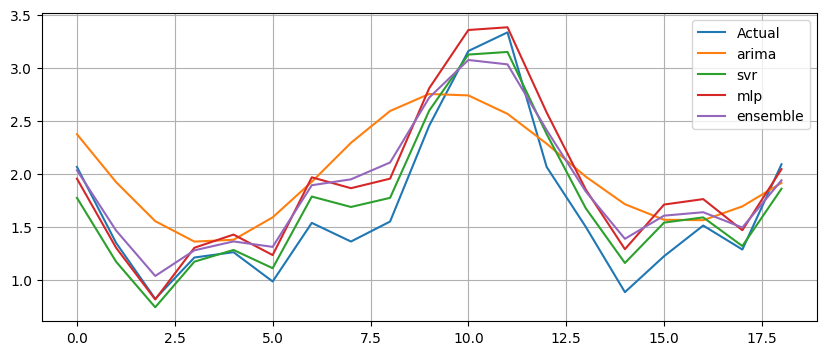

Generation 4: Fitness = 2.59881




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6271306529891534
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6796905423960014
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.628327994387118
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.149641100183495
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.627136380542775
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6271705164814991
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.146453656273562
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0845974454131986
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6796777109779355
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6272573533004935
SVRModel {'kernel': 'linear', 'c': 42.804237467126725, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.468938265075789
SVRModel {'kernel': 'linear', 'c': 50.50009080274292, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.4679450291880185
SVRModel {'kernel': 'linear', 'c': 33.70776447302077, 'gamma': 'scale', 'epsilon': 0.46829196192903794} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


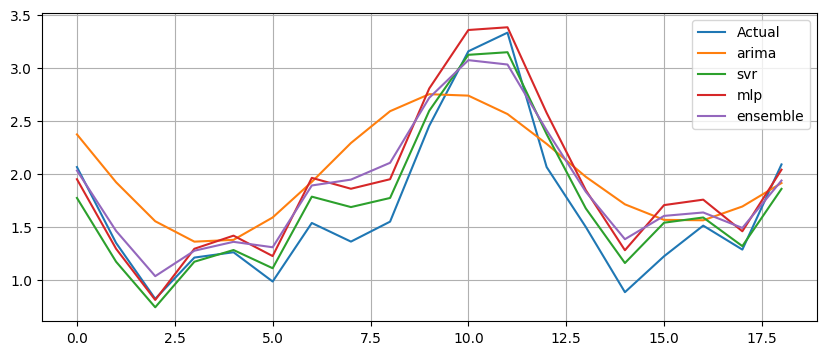

Generation 5: Fitness = 2.60998




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6271973900719374
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.9488187812616857
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6273242153161822
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6273242153161822
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6273242153161822
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6272573533004935
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.627390585604405
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6263240578381386
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6795464855101845
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.149641100183495
SVRModel {'kernel': 'linear', 'c': 59.59656379684887, 'gamma': 'scale', 'epsilon': 0.46829196192903794} Fitness: 4.469655285727614
SVRModel {'kernel': 'linear', 'c': 59.59656379684887, 'gamma': 'scale', 'epsilon': 0.46829196192903794} Fitness: 4.504709518692846
SVRModel {'kernel': 'linear', 'c': 59.59656379684887, 'gamma': 'scale', 'epsilon': 0.468291961929037

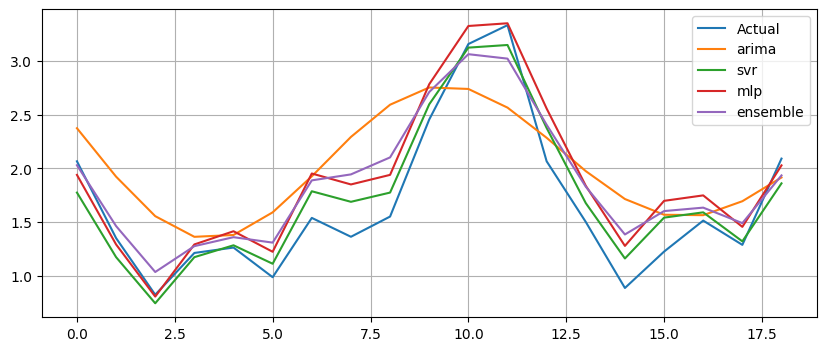

Generation 6: Fitness = 2.62369




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6861609309693242
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6273242153161822
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0839841471011755
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6272308206910397
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6274722138190894
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6351783044797563
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.149641100183495
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.084444180053224
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.627263994022951
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6795464855101845
SVRModel {'kernel': 'linear', 'c': 59.59656379684887, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.472647992394433
SVRModel {'kernel': 'linear', 'c': 59.59656379684887, 'gamma': 'scale', 'epsilon': 0.46829196192903794} Fitness: 4.468625113437427
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.468291961929038} F

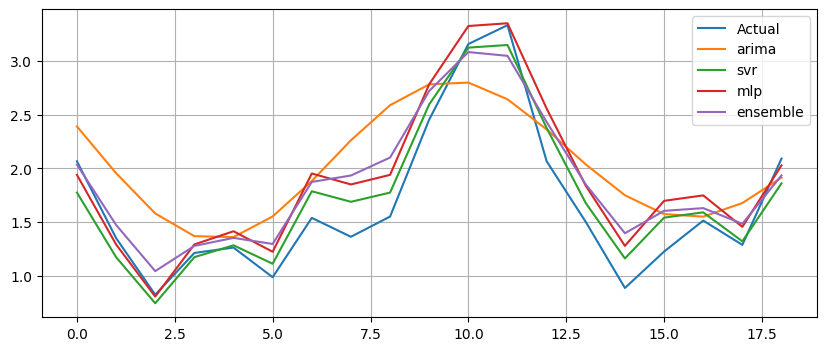

Generation 7: Fitness = 2.62153




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6796905423960014
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9604799986184756
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6272308206910397
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6862553936776268
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6273242153161822
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6276269665885383
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.686453574269965
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6795464855101845
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6272308206910397
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1680703986040397
SVRModel {'kernel': 'linear', 'c': 45.84072944816162, 'gamma': 'scale', 'epsilon': 0.4682919619290379} Fitness: 4.4679450291880185
SVRModel {'kernel': 'linear', 'c': 59.59656379684887, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.502668589315521
SVRModel {'kernel': 'linear', 'c': 59.59656379684887, 'gamma': 'scale', 'epsilon': 0.468291961929038}

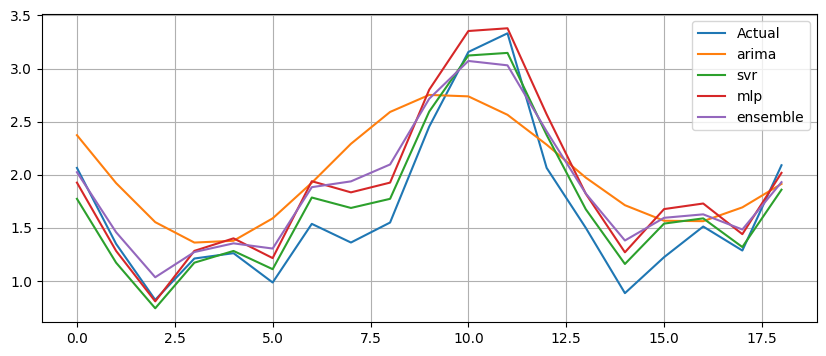

Generation 8: Fitness = 2.64576




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.2283081321467297
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1495878157911075
ArimaModel {'p': 2, 'd': 0, 'q': 4} Fitness: 1.222138527009337
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6371422856237945
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6795464855101845
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1496493749904073
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6276269665885383
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0477235022888667
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1495878157911075
SVRModel {'kernel': 'linear', 'c': 59.59656379684887, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.483498091264102
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.486263842496836
SVRModel {'kernel': 'linear', 'c': 59.59656379684887, 'gamma': 'scale', 'epsilon': 0.4432063889669589} F

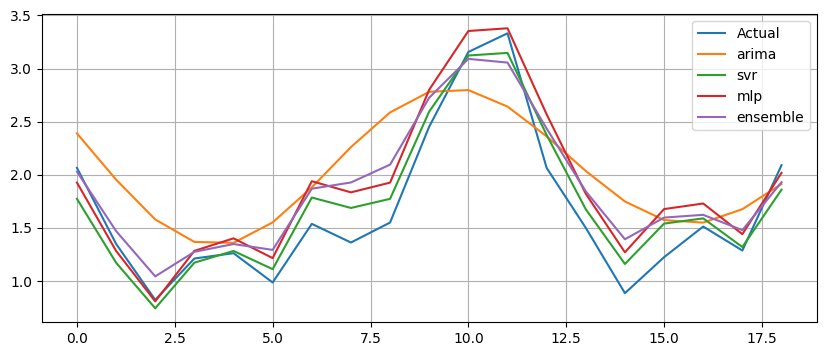

Generation 9: Fitness = 2.64254




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0903974259003553
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.2291247060832138
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6344666521760849
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0459977671979082
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0870562405822335
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6276269665885383
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.467613393654807
SVRModel {'kernel': 'linear', 'c': 59.59656379684887, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.491024265532944
SVRModel {'kernel': 'linear', 'c': 59.59656379684887, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitn

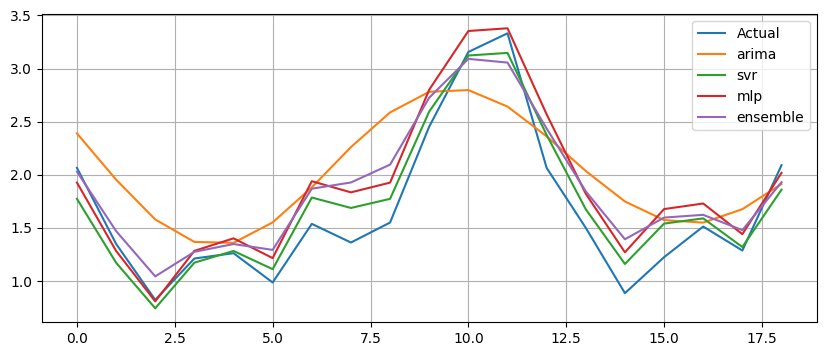

Generation 10: Fitness = 2.64254




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6857175303559586
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1336824418364466
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.637605763084804
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.68510049384433
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
SVRModel {'kernel': 'linear', 'c': 59.59656379684887, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.471087358579583
SVRModel {'kernel': 'linear', 'c': 48.42225704104866, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.467613393654807
SVRModel {'kernel': 'linear', 'c': 59.59656379684887, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


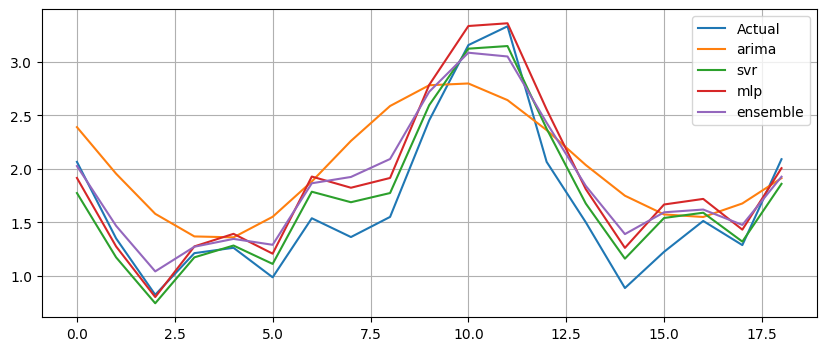

Generation 11: Fitness = 2.66196




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6843008017813392
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865552389572767
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6946733939834278
SVRModel {'kernel': 'linear', 'c': 59.596563796848876, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.467613393654807
SVRModel {'kernel': 'linear', 'c': 59.596563796848876, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.467613393654807
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitne

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


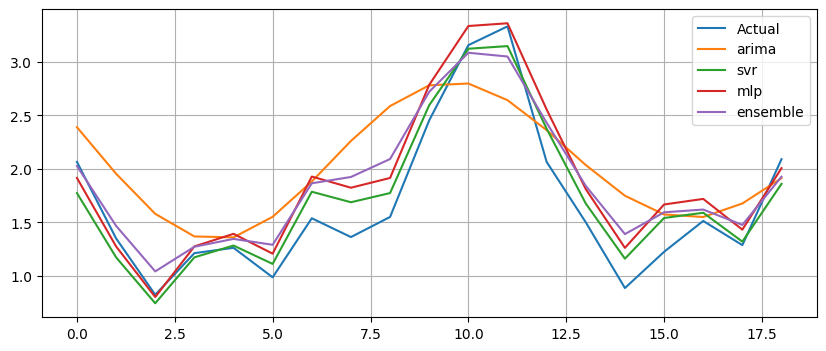

Generation 12: Fitness = 2.66149




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0486180969513683
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686456637848181
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.68650431345873
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1633766930505787
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686502219729887
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865036253978807
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866322458684382
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.467613393654807
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.495189643582247
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


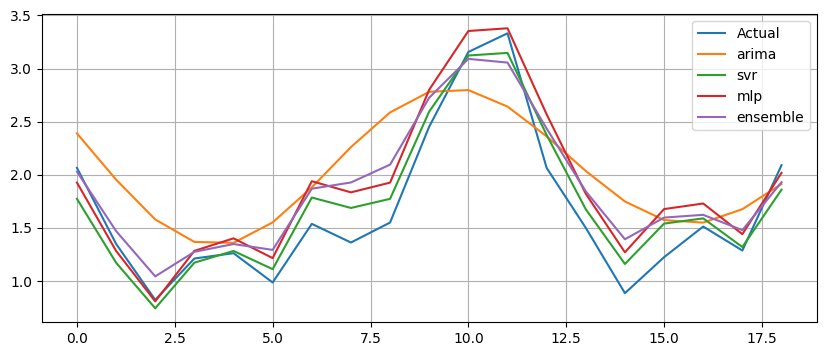

Generation 13: Fitness = 2.64254




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865023961897463
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.68570598551129
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6863151174721713
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865819046475141
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6864570704877038
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.68650431345873
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6857049854459512
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1632349779287234
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0484171188655709
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.4676118079185025
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.47107219798787
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.43585474575957217} Fit

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


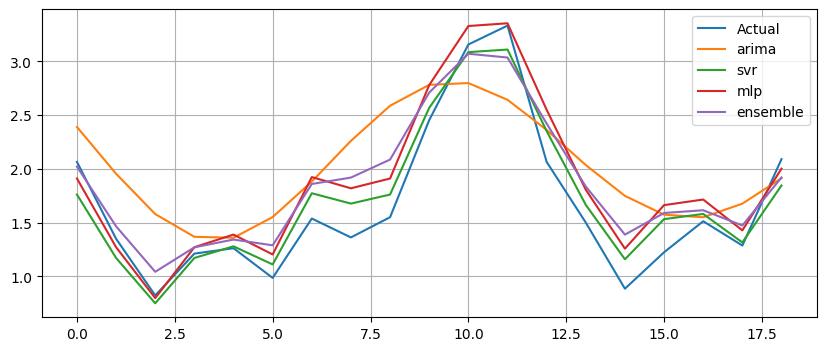

Generation 14: Fitness = 2.68128




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686501414988547
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865210187094641
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866015083684311
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865143610243731
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.68650431345873
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686536240993268
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.163392705067385
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865281891208141
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.169161417465592
SVRModel {'kernel': 'linear', 'c': 58.42503859502394, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.467613393654807
SVRModel {'kernel': 'linear', 'c': 61.241115584642195, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.467613393654807
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.4922737063953207} Fitne

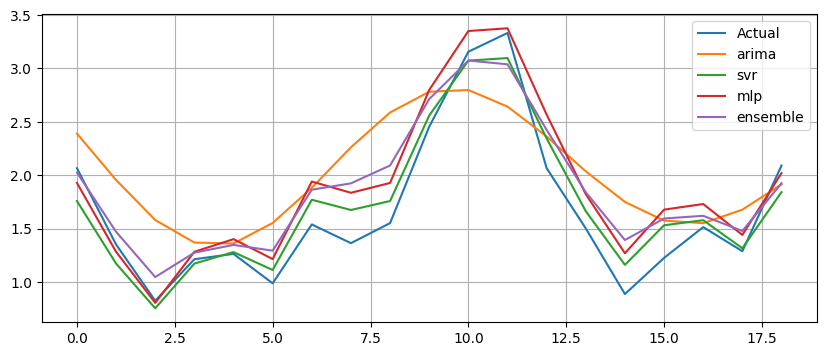

Generation 15: Fitness = 2.66147




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6864517204404985
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866104956931403
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.1691617702662256
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6940326795189715
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686563347271741
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866104956931403
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6875674689048341
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6864315006921233
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865239171796471
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.4393690940583363} Fitness: 4.3691837897279715
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5295688702360835
SVRModel {'kernel': 'linear', 'c': 61.62854529844976, 'gamma': 'scale', 'epsilon': 0.468291961929038} Fitness: 4.48

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


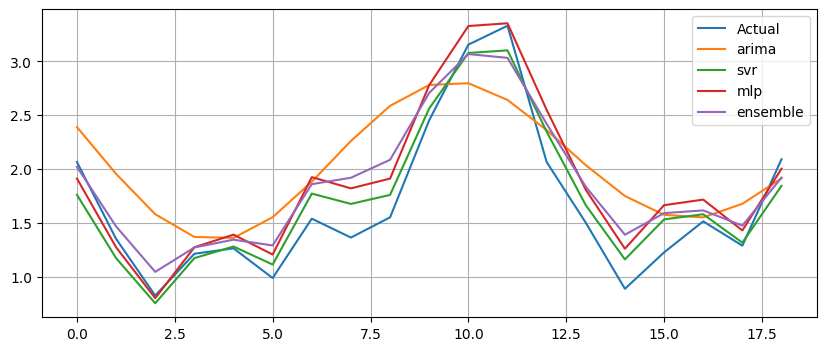

Generation 16: Fitness = 2.68227




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866050062615572
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865988699534258
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6863031569354339
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.627784481687249
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866054087184903
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866057884303391
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685029643824958
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866104956931403
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1629152349262684
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866113166533467
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.4957556048488899} Fitness: 4.524319174268311
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.4927661241617587} Fitness: 4.520052210887988
SVRModel {'kernel': 'linear', 'c': 61.70032285031563, 'gamma': 'scale', 'epsilon': 0.4962480226153279}

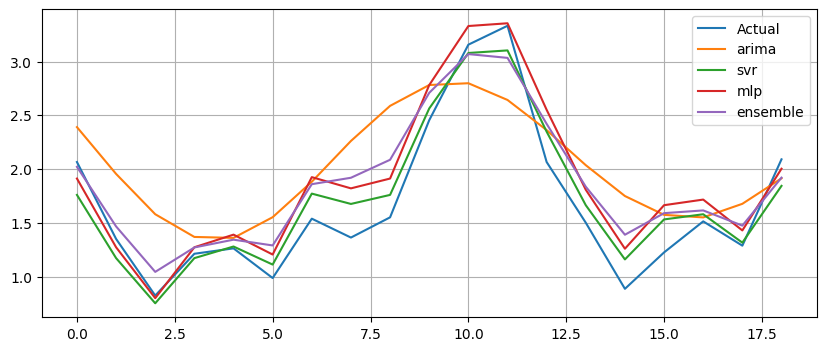

Generation 17: Fitness = 2.68193




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1336638570823538
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0472721875391586
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1174529471292485
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866057186608567
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1174546475196205
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866121599754489
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866129636856162
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6911260346059491
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0485285185177797
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866066775144324
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.548434331699919
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.558989089774848
SVRModel {'kernel': 'poly', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.4962480226153279} Fitness: 1.1336677173035241
S

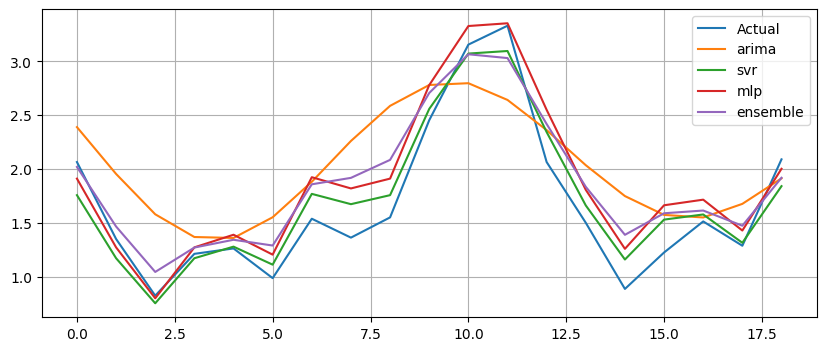

Generation 18: Fitness = 2.68436




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866116668845919
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686611291810469
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866121963152043
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866099664942202
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866116668845919
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6277834416668377
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866109420668733
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 58.814083624768756, 'gamma': 'scale', 'epsilon': 0.4994491459573415} Fitness: 4.528937392881498
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529565352679505
SVR

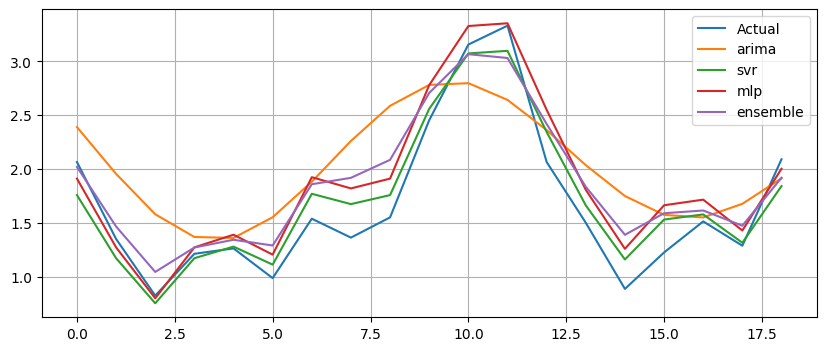

Generation 19: Fitness = 2.68437




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686611163133259
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686611163133259
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8648288613964439
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6376833540375155
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1086222246238773
SVRModel {'kernel': 'linear', 'c': 61.70032285031563, 'gamma': 'scale', 'epsilon': 0.4994491459573415} Fitness: 4.528933364574976
SVRModel {'kernel': 'linear', 'c': 61.70032285031563, 'gamma': 'scale', 'epsilon': 0.4994491459573415} Fitness: 4.528933364574976
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.52955754

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


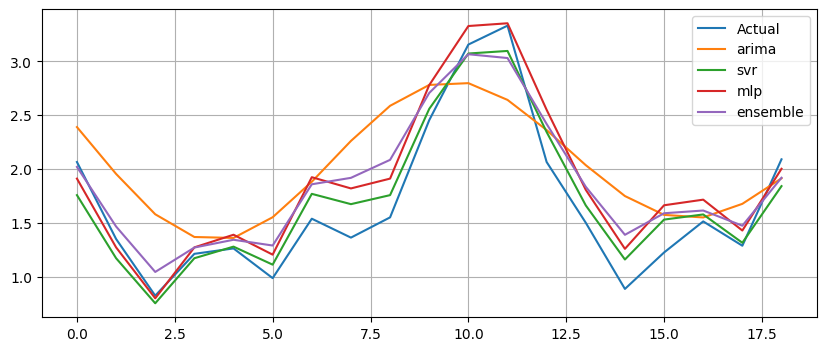

Generation 20: Fitness = 2.68464




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686379815980942
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8648288613964439
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6863908711666067
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
SVRModel {'kernel': 'linear', 'c': 59.30618499320556, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.531383000044913
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'li

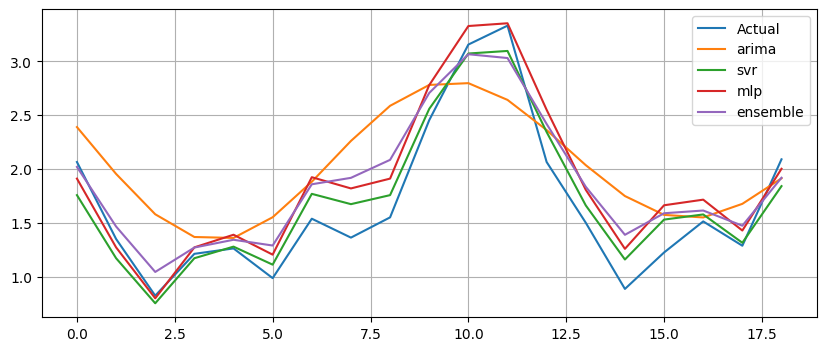

Generation 21: Fitness = 2.68464




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1336672801569139
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865010644319374
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1532160614472817
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'l

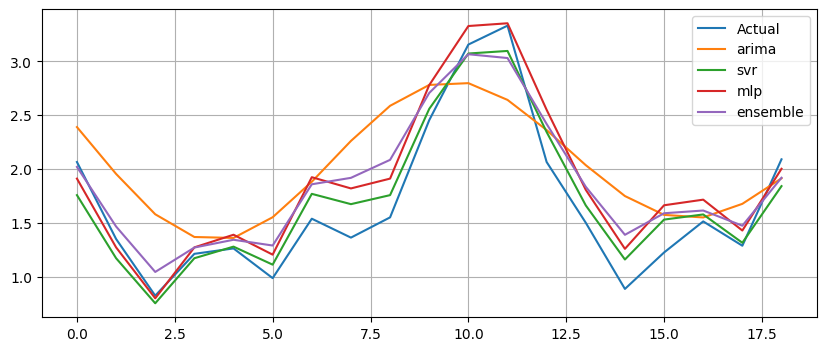

Generation 22: Fitness = 2.68464




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1088206498300357
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6856911872503564
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6864589125118017
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686543355111003
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'poly', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.120628046811447
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'lin

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


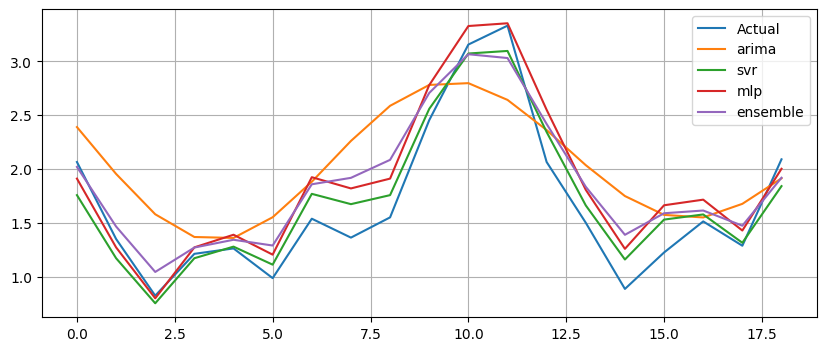

Generation 23: Fitness = 2.68464




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6864768071370926
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865732507723015
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
SVRModel {'kernel': 'linear', 'c': 57.976895533537245, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 57.976895533537245, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': '

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


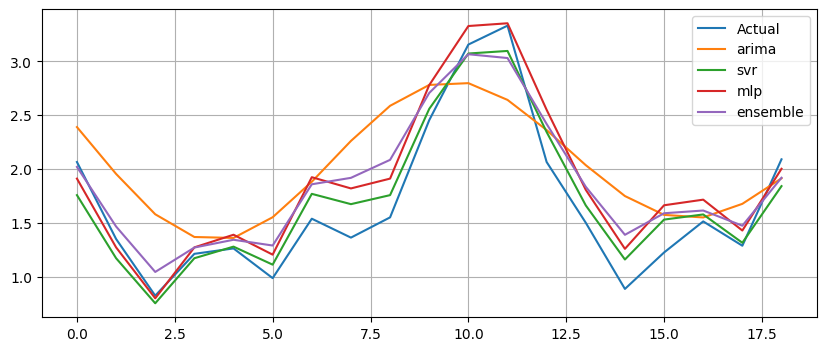

Generation 24: Fitness = 2.68464




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.1687150722945592
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6960512172158784
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6860587112251186
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6864372282118865
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.1687150722945592
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547176956300321
SVRModel {'kernel': 'linear', 'c': 57.97689553353724, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 

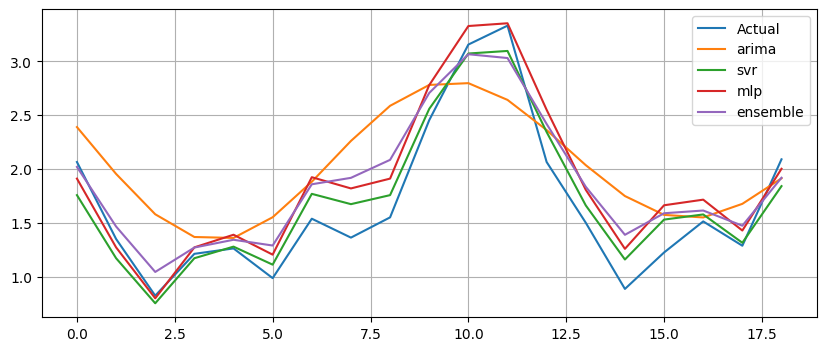

Generation 25: Fitness = 2.68464




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.1687150722945592
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6889441384497488
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6864438857562205
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6376839969398167
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.047742260721887
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685642977828838
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547176956300321
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': '

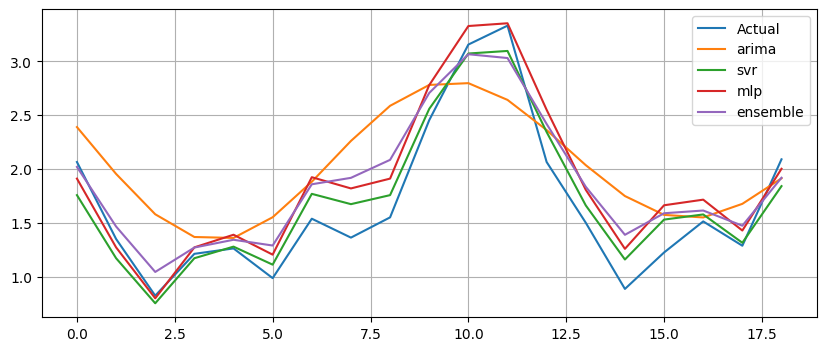

Generation 26: Fitness = 2.68464




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8648288613964439
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6376839969398167
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6864715618199324
SVRModel {'kernel': 'linear', 'c': 65.44811327349899, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.58352845559674
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'li

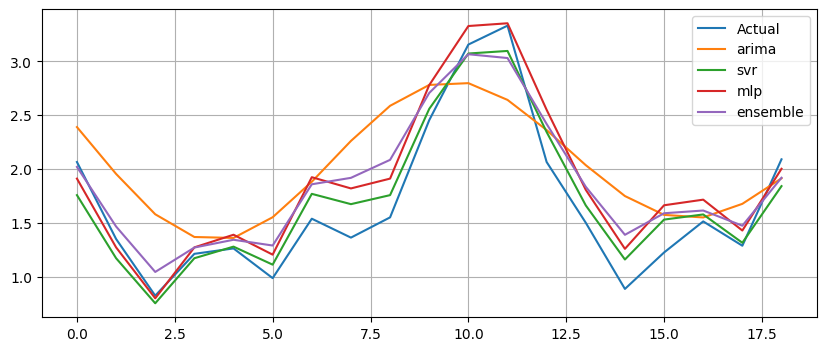

Generation 27: Fitness = 2.68464




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8648288613964439
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6863465247951033
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'li

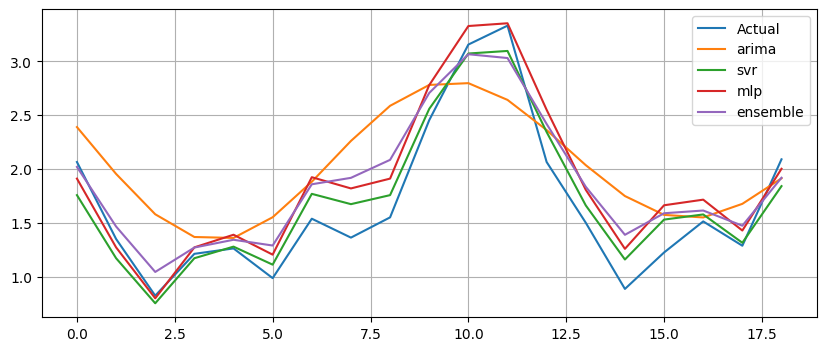

Generation 28: Fitness = 2.68464




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6863970192471327
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.646922348568006
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6861587817399857
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1624960292303896
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.530211986275352
SVRModel {'kernel': 'rbf', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.497276355512399
SVRModel {'kernel': 'line

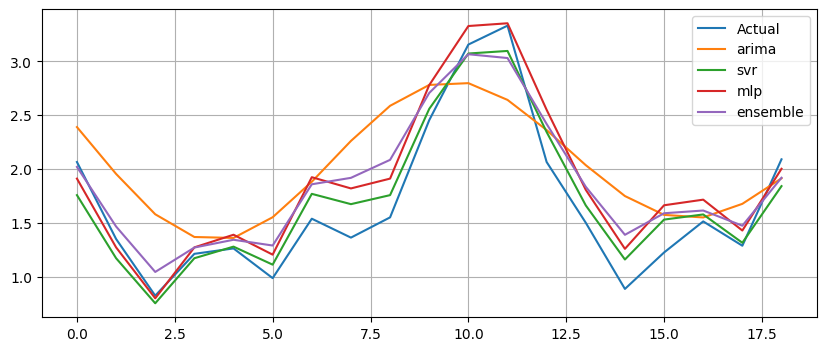

Generation 29: Fitness = 2.68464




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6864793719366653
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1532160614472817
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869236167151096
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6864426203947926
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.531751500763367
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547987272953188
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': '

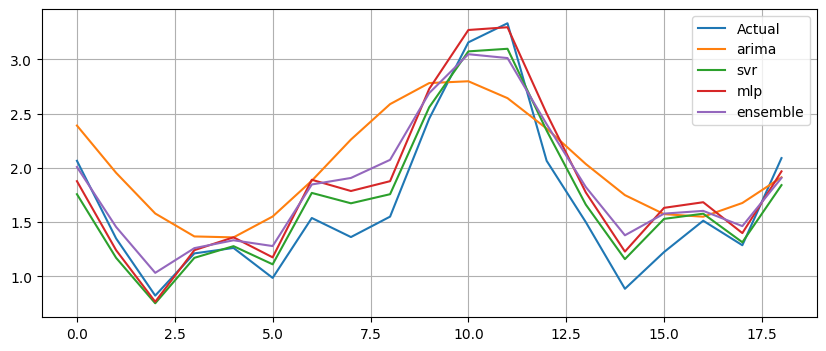

Generation 30: Fitness = 2.74387




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6863010194279582
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6864078384972787
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0485232855033675
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 67.95560204590883, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'l

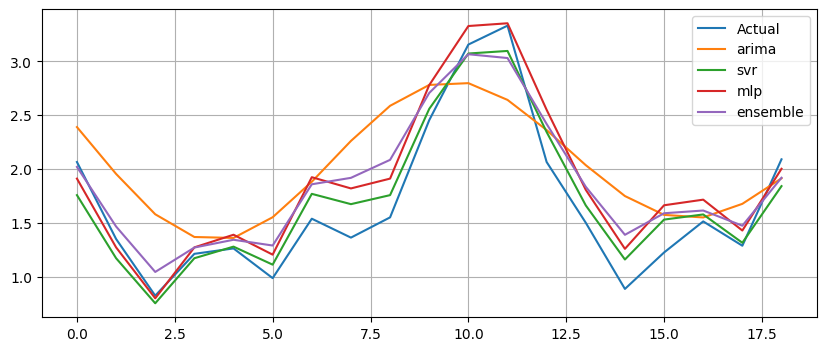

Generation 31: Fitness = 2.68464




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865848888329187
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0485232855033675
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6376839969398167
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
SVRModel {'kernel': 'linear', 'c': 55.1108824543207, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 64.9575185387576, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'lin

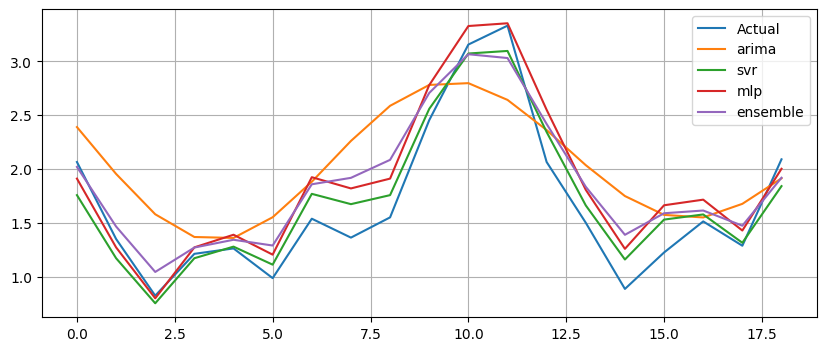

Generation 32: Fitness = 2.68464




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1084415294197525
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865292707331034
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6857781460714176
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'p

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


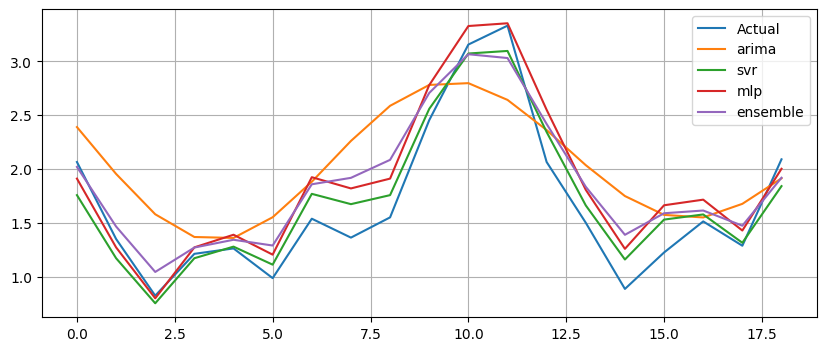

Generation 33: Fitness = 2.68464




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6850359941005306
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.627784481687249
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6864903716319366
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 66.08031233624094, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.530581670618643
SVRModel {'kernel': 'li

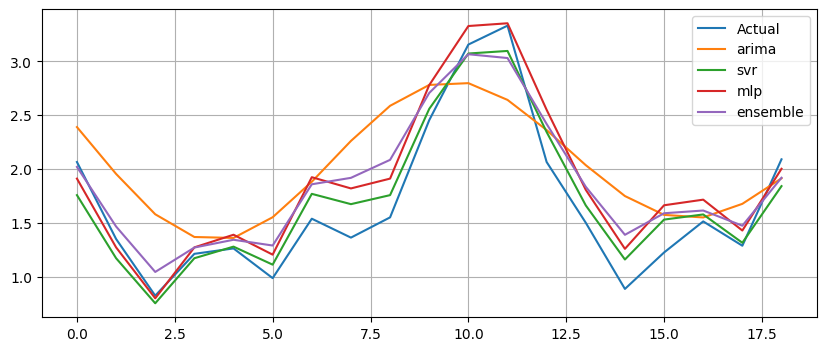

Generation 34: Fitness = 2.68464




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6863010194279582
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.627784481687249
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0481115929787719
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867879991130024
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 59.59656379684888, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.533350253391239
SVRModel {'kernel': 'linear', 'c': 56.887207411738615, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': '

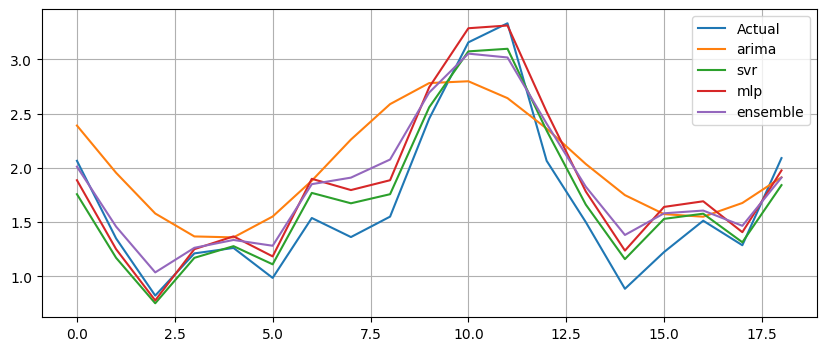

Generation 35: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6860986699289608
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6860777451264854
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
SVRModel {'kernel': 'linear', 'c': 59.173538144736526, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': 'linear', 'c': 57.31023306385097, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.530316849634473
SVRModel {'kernel': 'linear', 'c': 57.31023306385097, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529557548329403
SVRModel {'kernel': '

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


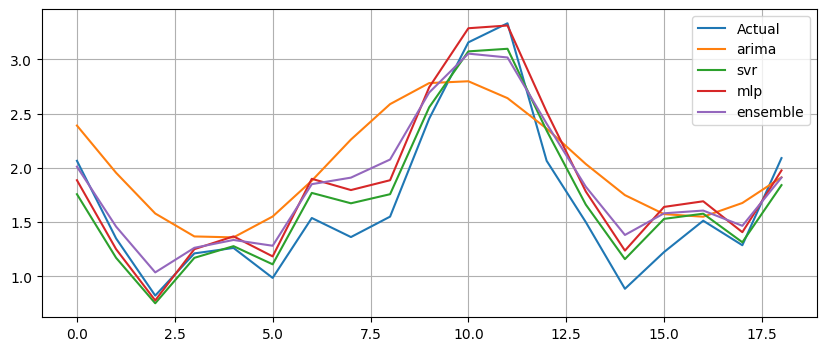

Generation 36: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1534578317199387
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686485737606514
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1531858576773208
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0485232855033675
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866424203025718
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686376118245329
SVRModel {'kernel': 'linear', 'c': 58.267368421663946, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 57.31023306385097, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547606915242448
SVRModel {'kernel': 'linear', 'c': 57.31023306385097, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.530455206708449
SVRModel {'kernel':

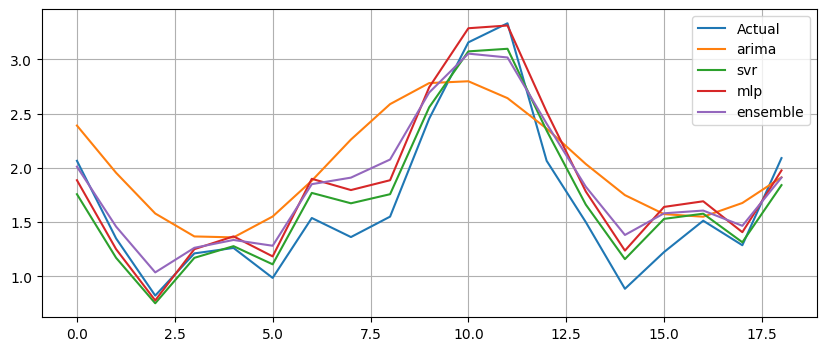

Generation 37: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0482184538181605
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6860913184078217
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866424203025718
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866424203025718
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686612138705912
SVRModel {'kernel': 'linear', 'c': 57.524805310426956, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.557272600435804
SVRModel {'kernel': 'linear', 'c': 57.524805310426956, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.534586299008101
SVRModel {'kernel': 'linear', 'c': 58.267368421663946, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kern

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


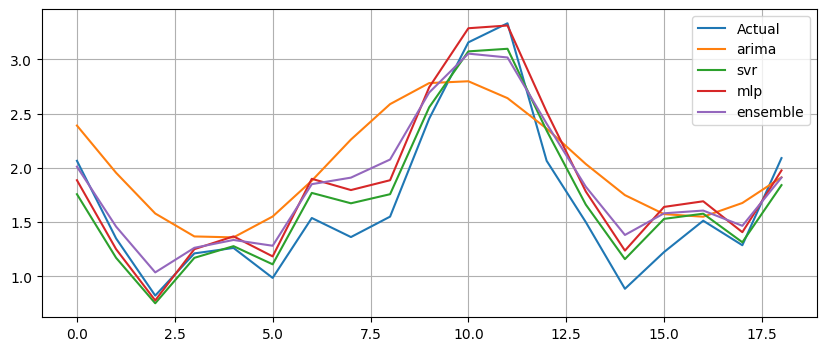

Generation 38: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6373621964150267
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686641086368364
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686381355053501
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867169690903883
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865306898686299
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.865092402035177
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866424203025718
SVRModel {'kernel': 'linear', 'c': 57.524805310426956, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.532314622214274
SVRModel {'kernel': 'linear', 'c': 57.524805310426956, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 57.524805310426956, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529500918324602
SVRModel {'kern

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


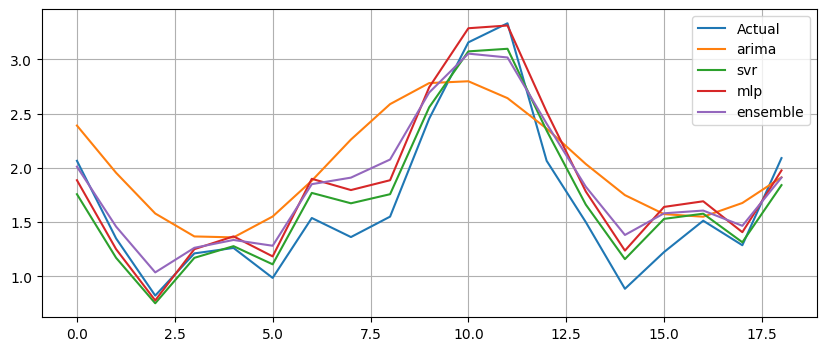

Generation 39: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1630418262666646
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867169690903883
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.68677279937591
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.68674992675635
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866009387105543
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6280265744418945
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6962434988374377
SVRModel {'kernel': 'linear', 'c': 57.4651002113668, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547373170440933
SVRModel {'kernel': 'linear', 'c': 57.452495235997816, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 57.39279013693766, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5293427340779715
SVRModel {'kernel'

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


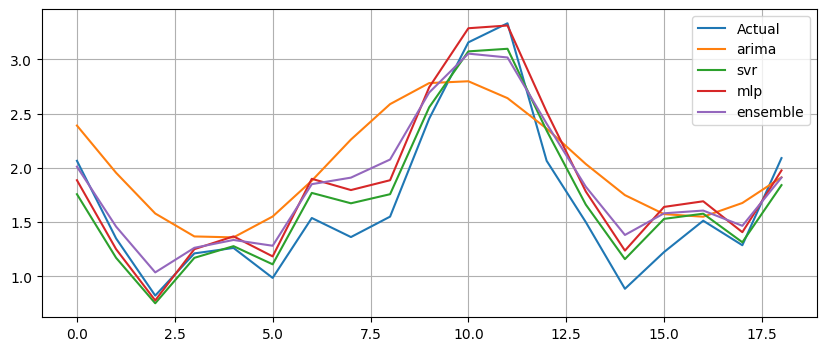

Generation 40: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.68677279937591
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.68677279937591
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1534578317199387
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8664657301899656
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.1688679504824353
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867910825087118
SVRModel {'kernel': 'linear', 'c': 57.524805310426956, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529228507286887
SVRModel {'kernel': 'linear', 'c': 44.66897870347006, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 57.524805310426956, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


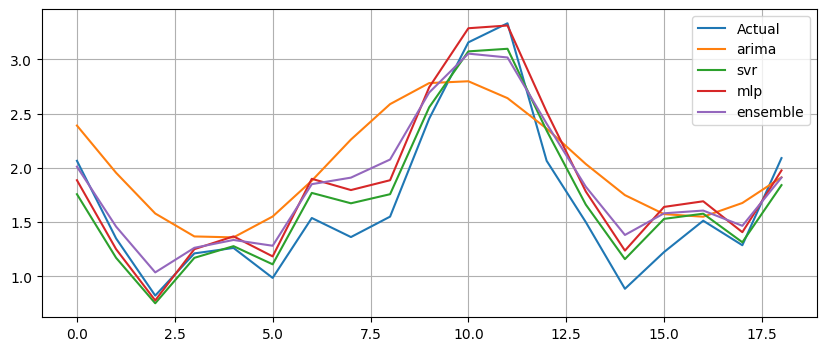

Generation 41: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.1688852594017554
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6379186239160608
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686752389211606
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
SVRModel {'kernel': 'linear', 'c': 57.49536756525799, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 55.757895279345064, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 57.4651002113668, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kerne

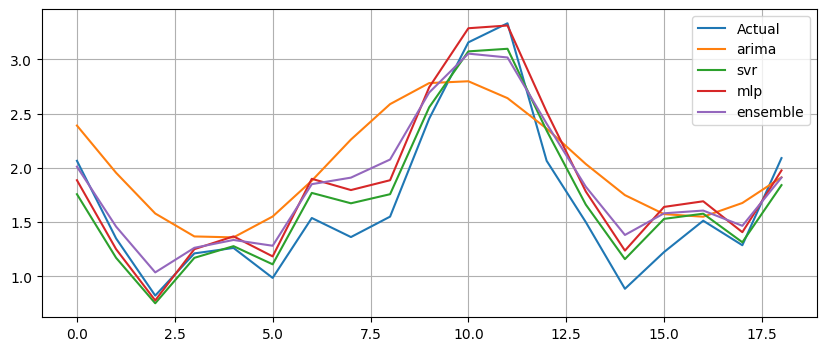

Generation 42: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 0.8573161823976583
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6831915379364104
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6849942694753204
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.695950863295755
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6379186239160608
SVRModel {'kernel': 'linear', 'c': 55.2195270576578, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 55.06369348093622, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.585897176835399
SVRModel {'kernel': 'linear', 'c': 52.20119413571528, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel

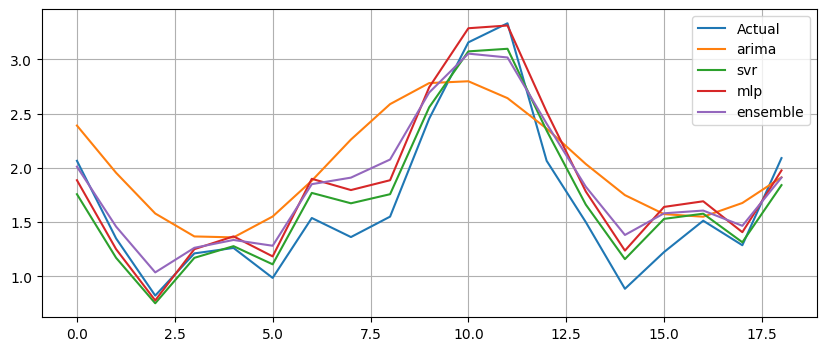

Generation 43: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.108696406515686
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
SVRModel {'kernel': 'linear', 'c': 54.14410999068494, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 52.58240940427932, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 54.13273235402684, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kerne

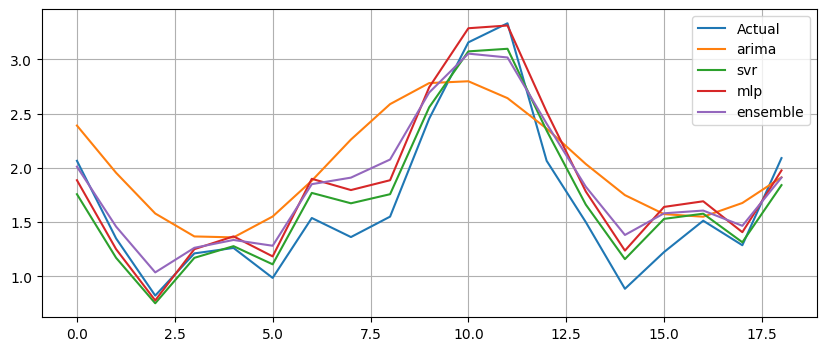

Generation 44: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6860317350922394
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6849942694753204
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865838041287669
SVRModel {'kernel': 'linear', 'c': 52.64760702243301, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 54.07891237253124, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.534443206832943
SVRModel {'kernel': 'linear', 'c': 54.14410999068494, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kern

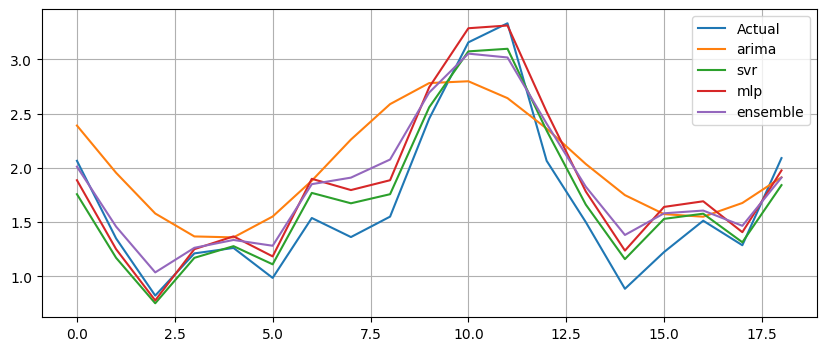

Generation 45: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.865395480771995
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.68666991685349
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1087862744662513
SVRModel {'kernel': 'linear', 'c': 54.17057894191048, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.583386133675238
SVRModel {'kernel': 'linear', 'c': 54.29532919437461, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel'

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


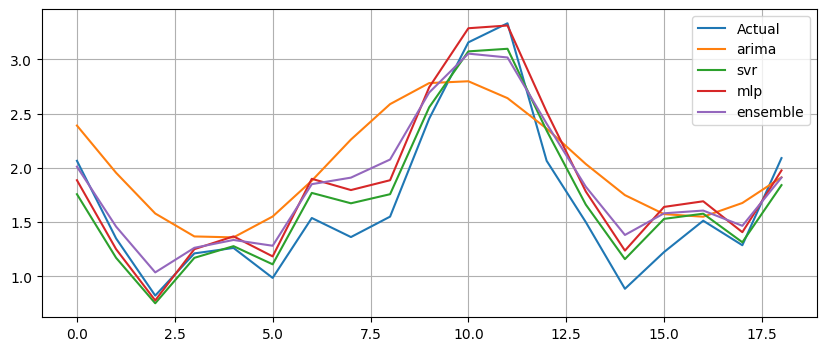

Generation 46: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6858237886660763
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0495170660253923
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6280265744418945
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
SVRModel {'kernel': 'linear', 'c': 54.268320230534435, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.533371083831249
SVRModel {'kernel': 'linear', 'c': 63.753734046326784, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'ke

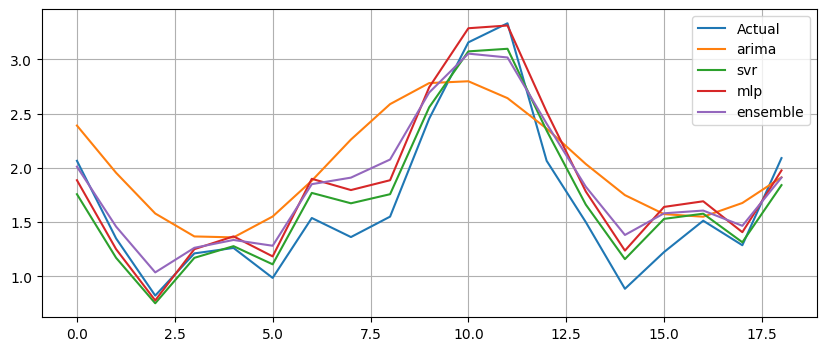

Generation 47: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6871356048945587
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1630418262666646
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 0.8573161823976583
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 54.1214442384246, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 63.753734046326784, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kern

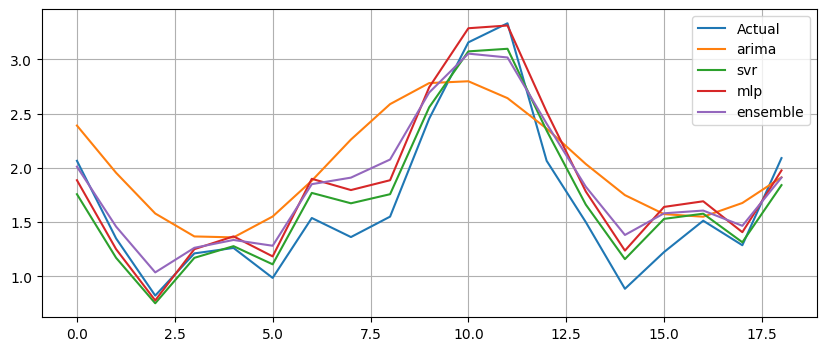

Generation 48: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6959163222071745
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6280265744418945
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 44.69916172126317, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kern

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


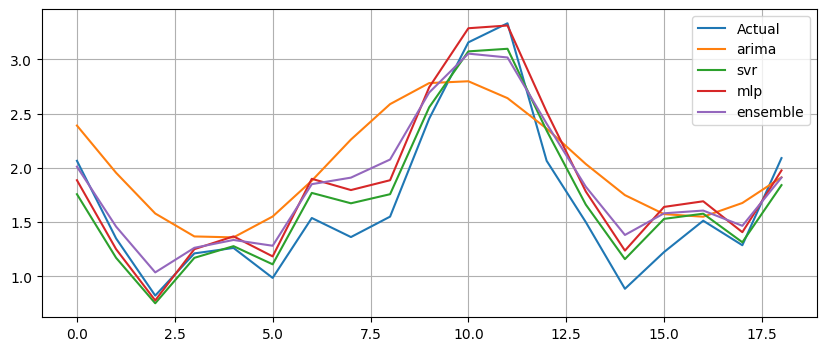

Generation 49: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0489751335781248
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685633573688553
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.556396064363322
SVRModel {'kernel': 'linear', 'c': 44.69916172126317, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kerne

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


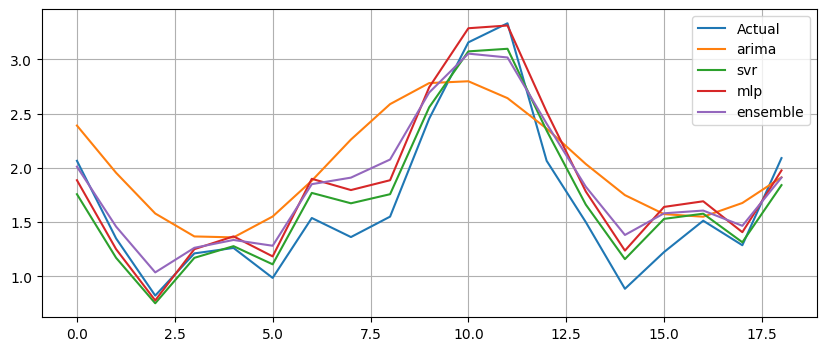

Generation 50: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865915764413708
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.637718703083221
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6860986699289608
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6863745785414437
SVRModel {'kernel': 'linear', 'c': 51.818265714764735, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.52962238306395
SVRModel {'kernel': 'linear', 'c': 47.01188553390073, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 44.99782139976289, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kerne

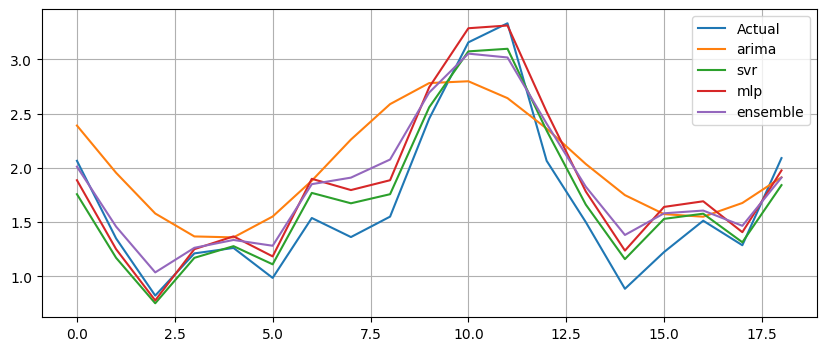

Generation 51: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.866076583316834
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6862540371214723
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6280265744418945
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854379742726548
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1630418262666646
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.047924968124092
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1630418262666646
SVRModel {'kernel': 'linear', 'c': 44.69916172126317, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5832598503593145
SVRModel {'kernel': 'linear', 'c': 44.69916172126317, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 51.818265714764735, 'gamma': 'scale', 'epsilon': 0.38996112612798345} Fitness: 3.427734034503499

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


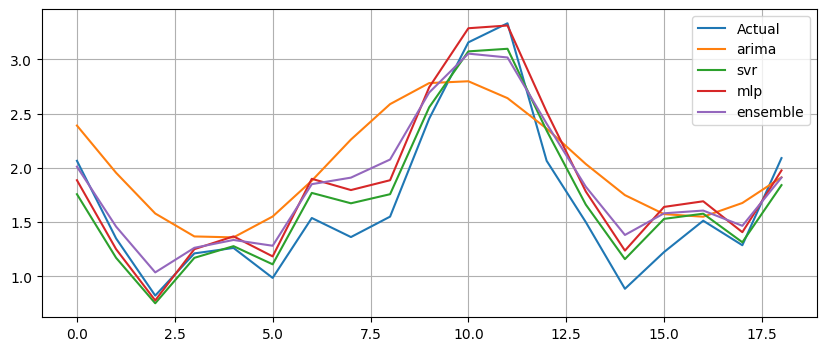

Generation 52: Fitness = 2.72639




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6962434988374377
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1634627744031354
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.9532897247639932
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 0.8484230211143569
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 0.857402100288691
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866658309790472
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
SVRModel {'kernel': 'rbf', 'c': 45.89036135343877, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.4956059943761761
SVRModel {'kernel': 'linear', 'c': 52.93978989522669, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 40.46229785017098, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel'

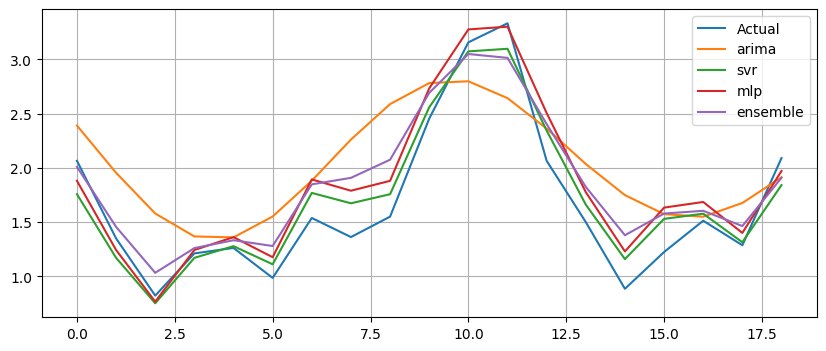

Generation 53: Fitness = 2.73996




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6379186239160608
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.1671583863290769
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6860348933588478
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1631062647471617
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 0.8533011303552573
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.134093432859983
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685700089428187
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529830381976744
SVRModel {'kernel': 'linear', 'c': 53.859353081967924, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kerne

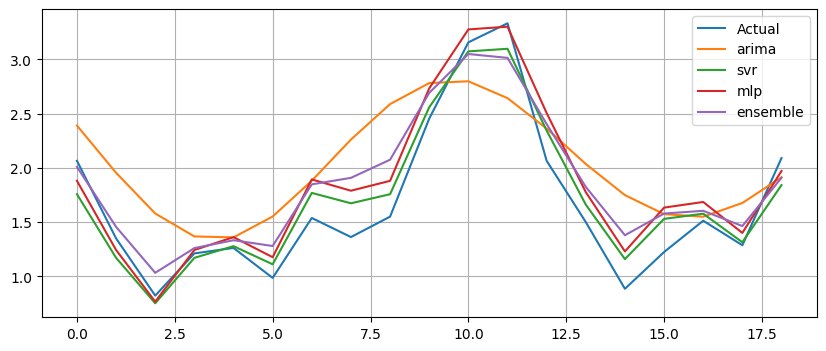

Generation 54: Fitness = 2.73996




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686588451286388
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867532372459553
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868044203274717
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867471886897827
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.108858837102596
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865117697893333
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529634378260475
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529177190618663
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529263207834597
SVRModel {'kernel

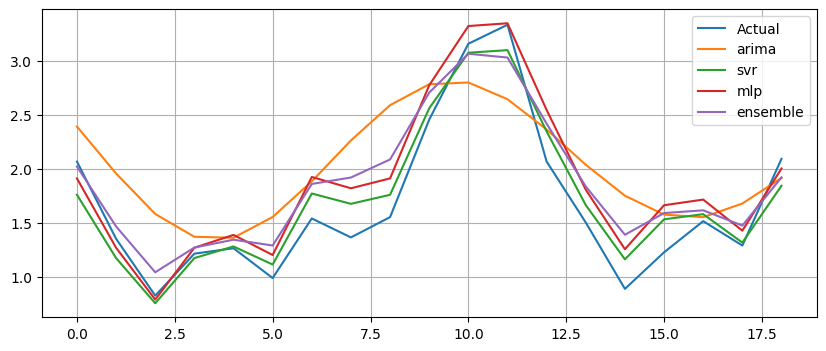

Generation 55: Fitness = 2.69172




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867890033670419
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867532372459553
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6849669790100772
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867261101399997
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0490609474044381
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686661894479848
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870690292498722
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686661894479848
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
SVRModel {'kernel': 'linear', 'c': 53.859353081967924, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.489981387978349} Fitness: 4.515258666592402
SVRModel {'kernel': 'linear', 'c': 54.052149217670674, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529263207834597
S

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


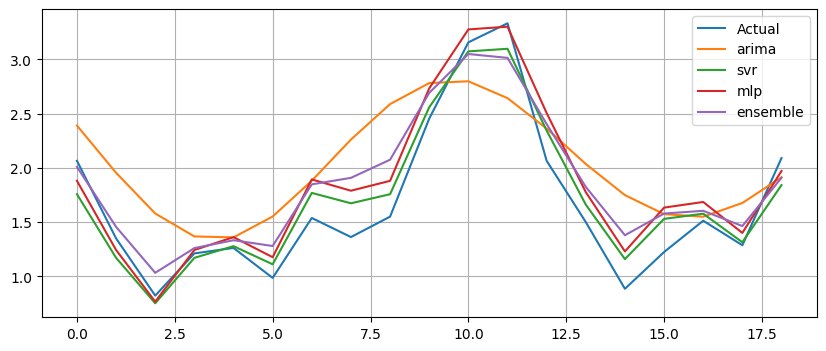

Generation 56: Fitness = 2.73996




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686661894479848
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1630418262666646
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866192132552085
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.684616135951614
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866302723617408
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0492128058725405
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5294907742859385
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547373170440933
SVRModel {'kerne

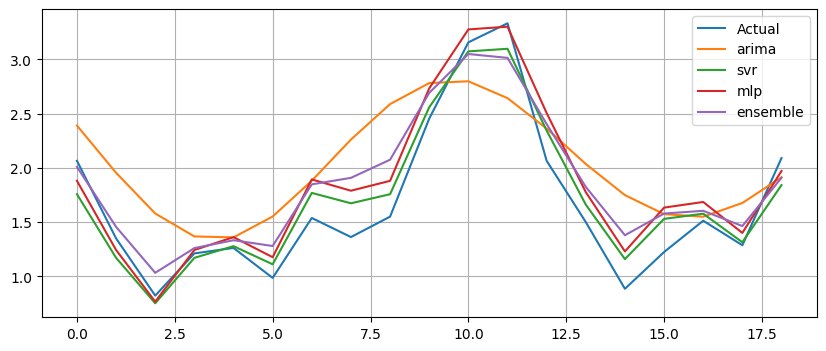

Generation 57: Fitness = 2.73996




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868182449694664
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 0.8579203363250086
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868787952094193
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529198263554603
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.585803924199004
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267
SVRModel {'kern

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


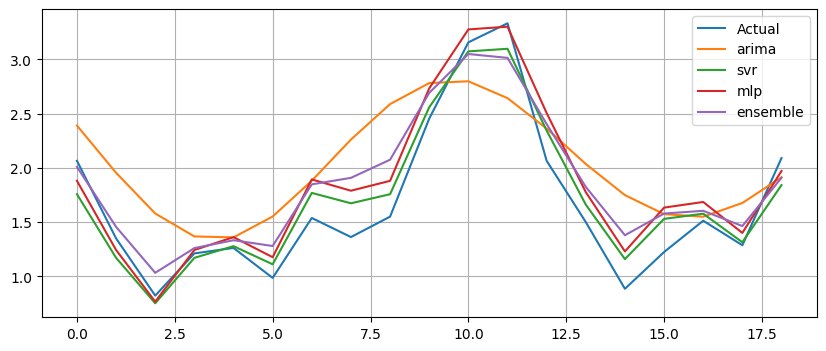

Generation 58: Fitness = 2.73996




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868815481679884
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866633680395693
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686543659436367
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868993587947199
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267
SVRModel {'kernel': 'linear', 'c': 54.10712720705799, 'gamma': 'scale', 'epsilon': 0.47445365918522797} Fitness: 4.483090773672775


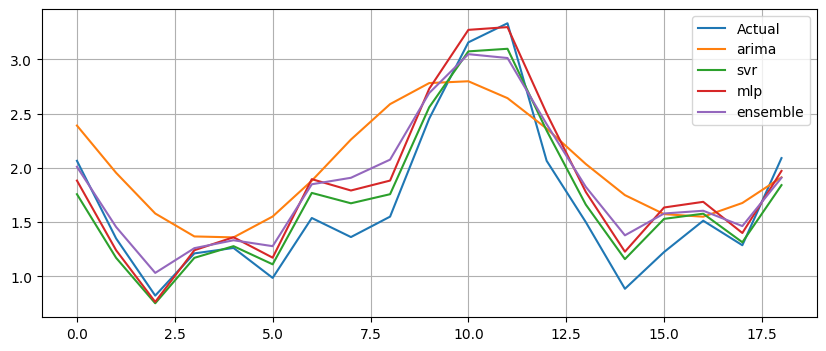

Generation 59: Fitness = 2.73971




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0488319685576306
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686639767480398
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6849062033708788
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6963502101411176
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867103581440521
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
SVRModel {'kernel': 'linear', 'c': 54.07215889899044, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.556604422636609
SVRModel {'kernel': 'linear', 'c': 54.08658324283779, 'gamma': 'scale', 'epsilon': 0.4940576103903627} Fitness: 4.522026864883705
SVRModel {'kernel': 'linear', 'c': 54.813564852083765, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267


/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


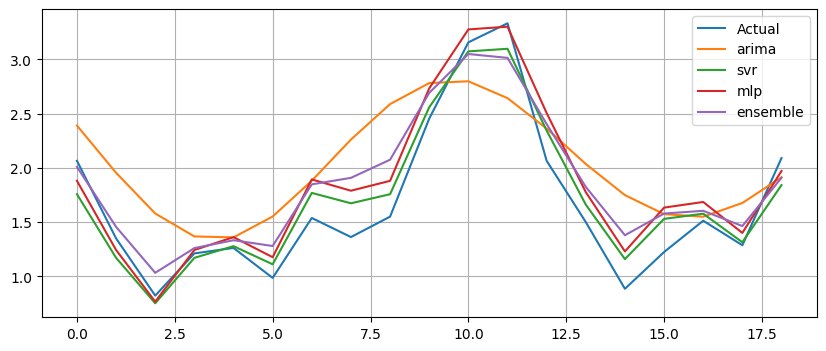

Generation 60: Fitness = 2.73996




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6963502101411176
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1522408042171506
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1478826511339713
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
SVRModel {'kernel': 'linear', 'c': 54.07215889899044, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267
SVRModel {'kernel': 'linear', 'c': 54.813564852083765, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267
SVRModel {'ker

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


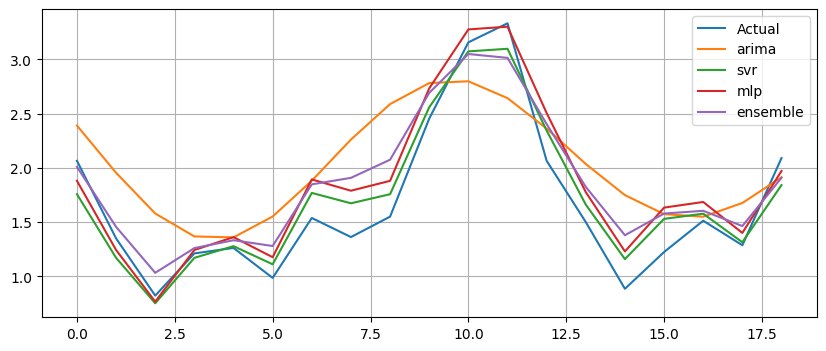

Generation 61: Fitness = 2.73996




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6842916723700725
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6842916723700725
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6963502101411176
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.109115380823076
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6889475517659884
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868848975307023
SVRModel {'kernel': 'linear', 'c': 54.11514306346815, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.530333955052586
SVRModel {'kernel': 'linear', 'c': 56.62749162779982, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.530333955052586
SVRModel {'kernel': 'linear', 'c': 54.17105180140108, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267
SVRModel {'kerne

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


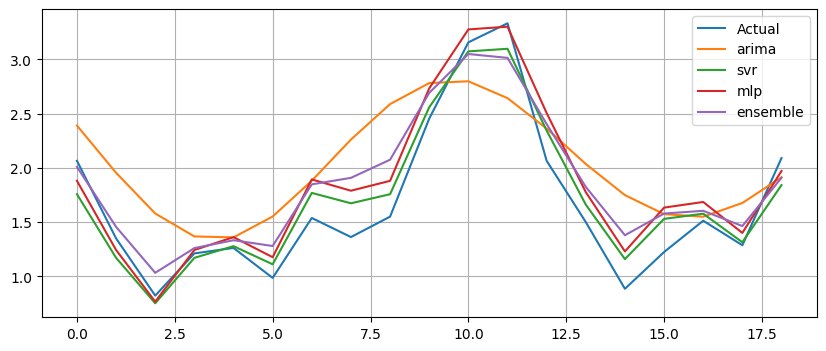

Generation 62: Fitness = 2.73996




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0492128058725405
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686898764858002
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866445029799249
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685346632165752
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868916542690267
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868862259209507
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.556302811726927
SVRModel {'kernel': 'linear', 'c': 56.62749162779982, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267
SVRModel {'kernel

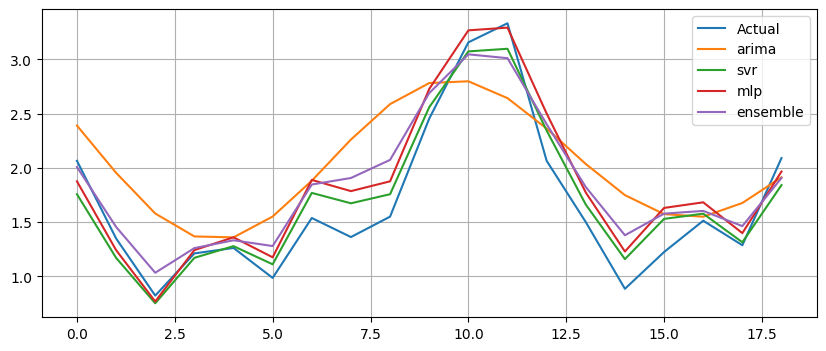

Generation 63: Fitness = 2.74371




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686898764858002
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865373267692765
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6851054740348612
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869071755029852
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0492128058725405
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.6760368826206333
SVRModel {'kernel': 'linear', 'c': 54.18512329167412, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5290343469735586
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267
SVRModel {'kernel': 'linear', 'c': 54.16032906525501, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529083937982267
SVRModel {'kern

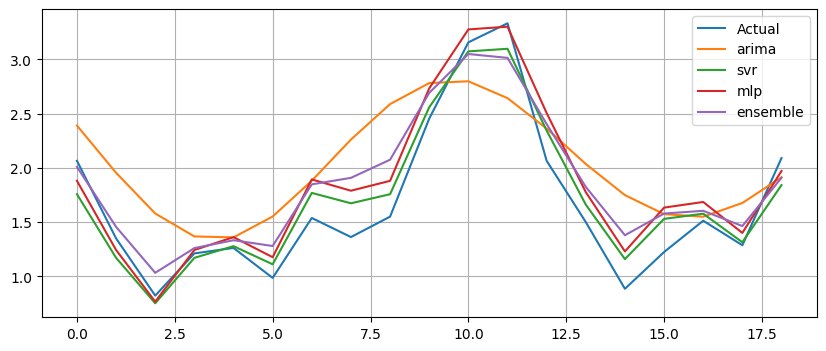

Generation 64: Fitness = 2.73996




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6379360723062821
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6845555687923688
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6876145250261243
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6864969007693935
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6877664997820192
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686898764858002
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686906101382644
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868665743471143
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869111316311516
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0492180047083277
SVRModel {'kernel': 'linear', 'c': 54.80399330380734, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529853683947809
SVRModel {'kernel': 'linear', 'c': 63.618054795797754, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.52951489880759
SVRModel {'kernel': 'linear', 'c': 64.23692480793098, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.536423963871399
SVRModel {'kernel

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


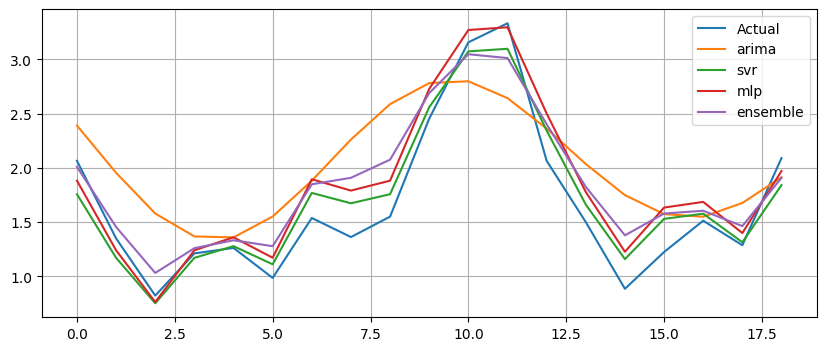

Generation 65: Fitness = 2.74092




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6883686873105126
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869071755029852
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869497696244962
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6877232467459051
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867747236334039
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869071755029852
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6963462540129512
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6875451945110729
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6872456607897834
SVRModel {'kernel': 'linear', 'c': 54.155783753821396, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.53799114611877
SVRModel {'kernel': 'linear', 'c': 54.155783753821396, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529063821763638
SVRModel {'kernel': 'linear', 'c': 64.23692480793098, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5290295685627875
SVRModel {'ke

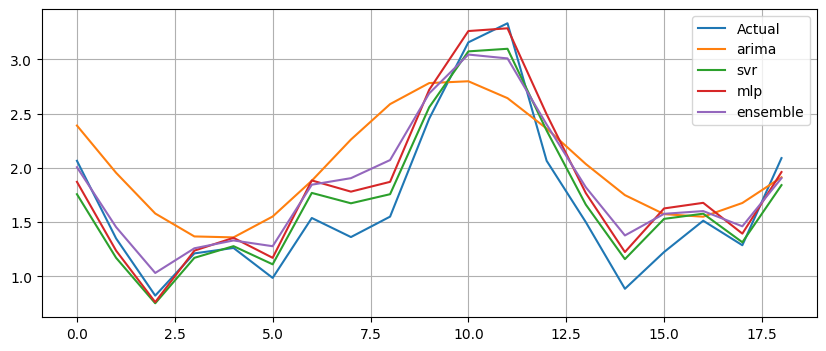

Generation 66: Fitness = 2.75337




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6882664958656475
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6857569922169056
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6857245603247113
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869497696244962
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869071755029852
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869071755029852
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867362333385358
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866711269908374
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865966046588359
SVRModel {'kernel': 'linear', 'c': 54.15273641898571, 'gamma': 'scale', 'epsilon': 0.36278160756197303} Fitness: 3.1365232803335523
SVRModel {'kernel': 'linear', 'c': 54.13403686223798, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.530805801670389
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.53082221704186

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


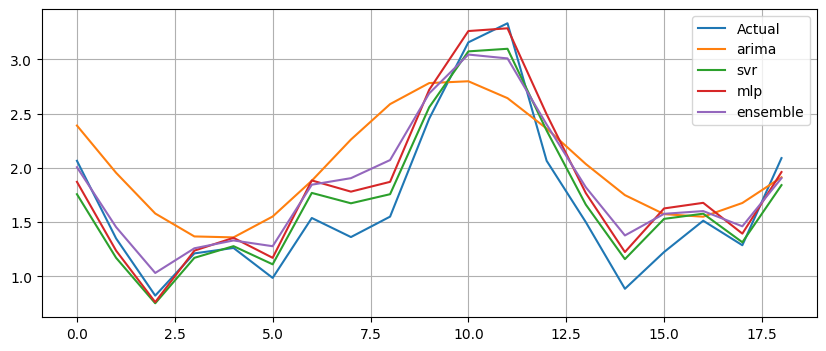

Generation 67: Fitness = 2.75337




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869497696244962
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.688294940416467
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867272448686577
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686946323345054
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869497696244962
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.670946650509297
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6840543154520828
SVRModel {'kernel': 'linear', 'c': 54.13403686223798, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 54.155783753821396, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5290295685627875
SVRModel {'kerne

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


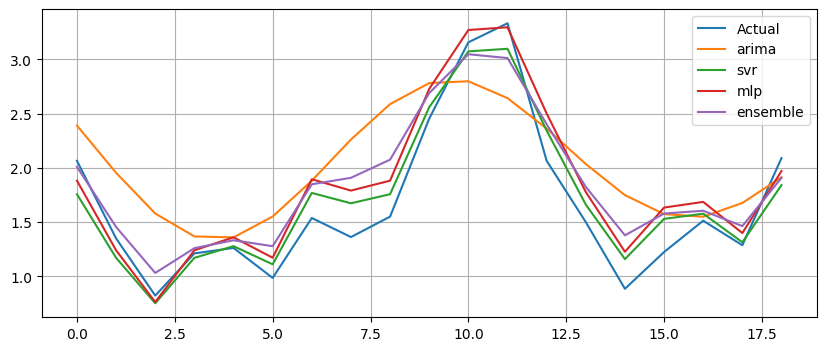

Generation 68: Fitness = 2.74092




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869071755029852
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6858175024120299
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869497696244962
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869071755029852
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6849141413549074
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6964185626626824
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
SVRModel {'kernel': 'linear', 'c': 52.97716375384409, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529063821763638
SVRModel {'kernel': 'linear', 'c': 53.79126576912838, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.534070022109375
SVRModel {'kern

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


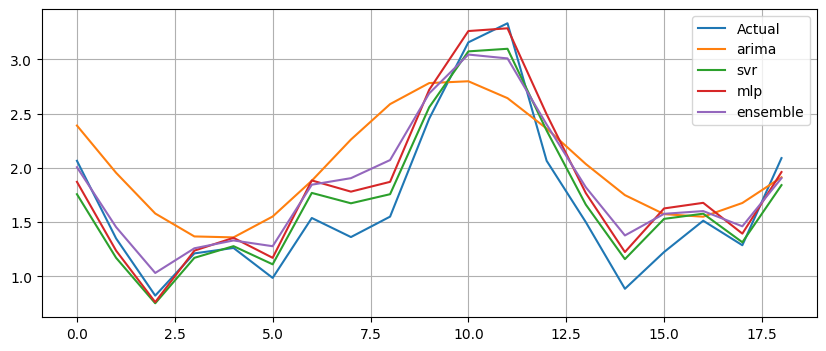

Generation 69: Fitness = 2.75337




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.635812953121111
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865740951614654
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866317622202245
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868164871221132
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870442132086192
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1632221834321785
SVRModel {'kernel': 'linear', 'c': 53.83622895514261, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5318461384322575
SVRModel {'kernel': 'linear', 'c': 54.08602634138806, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 54.13098952740229, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kern

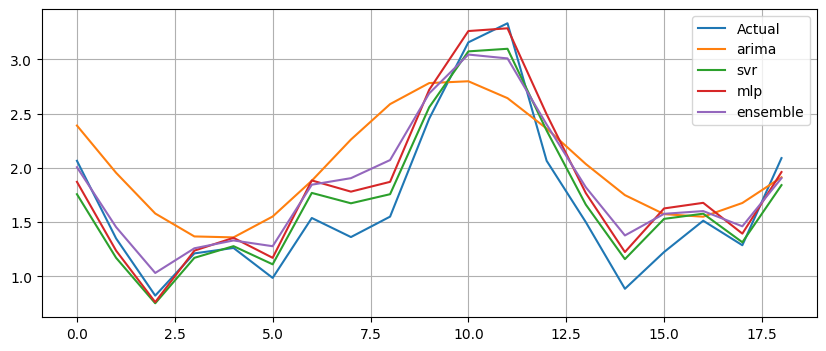

Generation 70: Fitness = 2.75337




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.1690606116141424
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868961785435423
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0493331831414243
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6964185626626824
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870044241532436
SVRModel {'kernel': 'linear', 'c': 53.79126576912838, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 53.92679561621081, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 53.79126576912838, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546595167296248
SVRModel {'kern

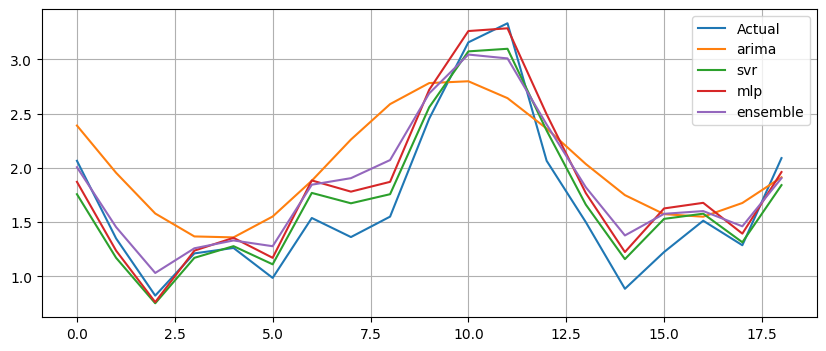

Generation 71: Fitness = 2.75337




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6848793357063547
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686658699663676
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868318386349277
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
SVRModel {'kernel': 'linear', 'c': 53.79126576912838, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.531013207203579
SVRModel {'kernel': 'linear', 'c': 53.6097576055861, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 53.75843597131429, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel

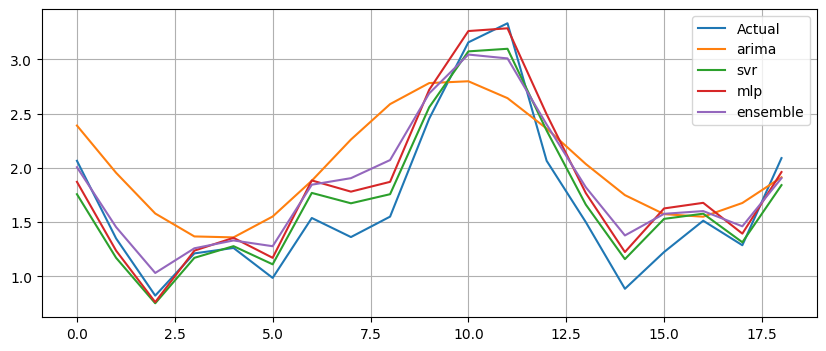

Generation 72: Fitness = 2.75337




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
SVRModel {'kernel': 'linear', 'c': 53.75843597131429, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 53.79126576912838, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 51.66256076860795, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kern

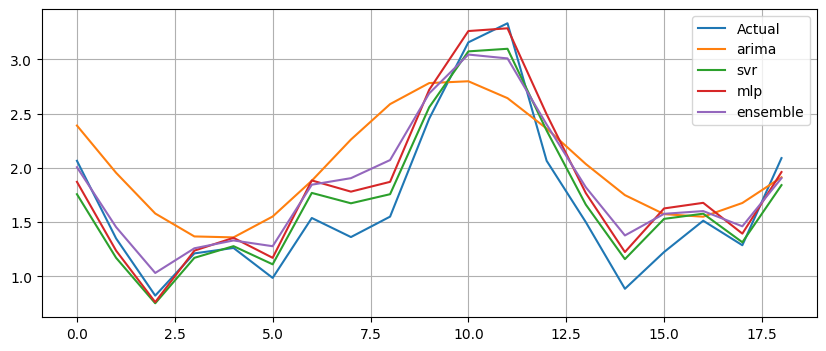

Generation 73: Fitness = 2.75337




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867461970554403
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869477588831792
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6381196707022336
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686569447208628
SVRModel {'kernel': 'linear', 'c': 53.6097576055861, 'gamma': 'scale', 'epsilon': 0.42378140823653326} Fitness: 4.002648720178044
SVRModel {'kernel': 'linear', 'c': 53.79126576912838, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 51.66256076860795, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
S

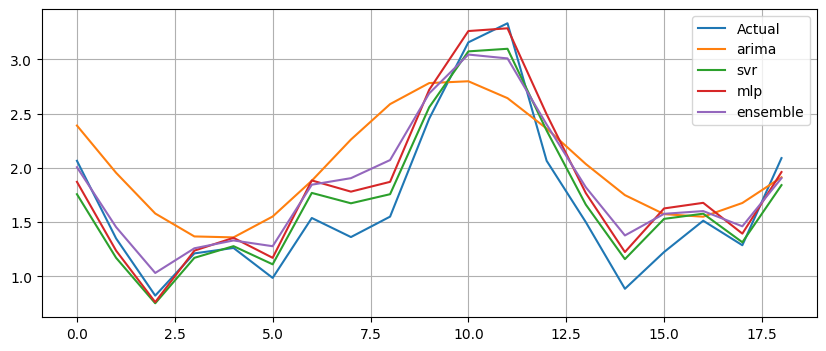

Generation 74: Fitness = 2.75337




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 0.8584675007031047
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869499293021135
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
SVRModel {'kernel': 'linear', 'c': 51.662560768607946, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 51.662560768607946, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.585695745542066
SVRModel {'kernel': 'linear', 'c': 52.94229737657237, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'ke

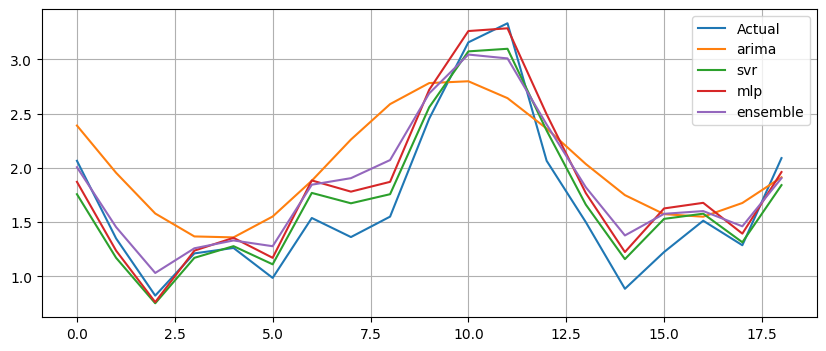

Generation 75: Fitness = 2.75337




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865101698377631
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869310184466237
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
SVRModel {'kernel': 'linear', 'c': 52.56243358245638, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 51.50221497940811, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 55.625148461925775, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529993584836585
SVRModel {'ker

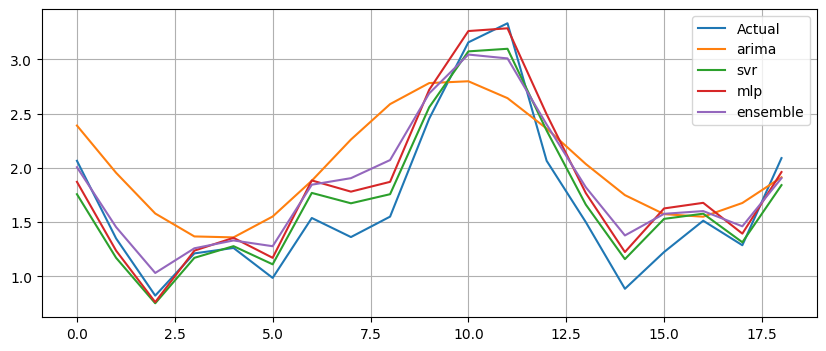

Generation 76: Fitness = 2.75337




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.163559877968638
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.1690606116141424
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6844322356711716
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686631093811072
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867032492148906
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 0.8584675007031047
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1088961984599424
SVRModel {'kernel': 'linear', 'c': 55.16689168722048, 'gamma': 'scale', 'epsilon': 0.47545697889979477} Fitness: 4.504006221320431
SVRModel {'kernel': 'linear', 'c': 52.22362146908504, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546595167296248
SVRModel {'kernel': 'linear', 'c': 53.04694420005638, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
S

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


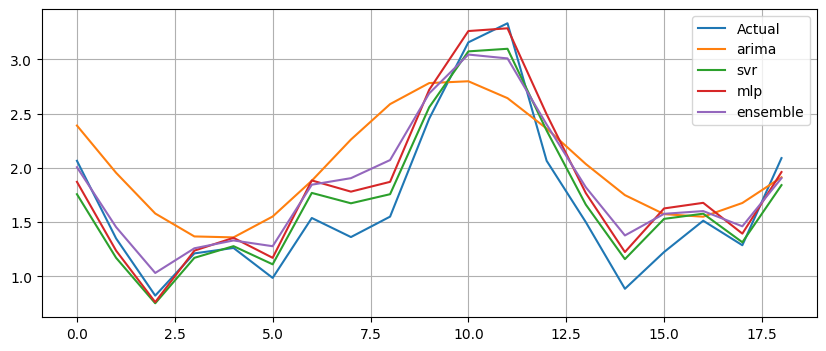

Generation 77: Fitness = 2.75337




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6964185626626824
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6964185626626824
SVRModel {'kernel': 'linear', 'c': 52.22362146908504, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 52.22362146908504, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 51.76536469437974, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kern

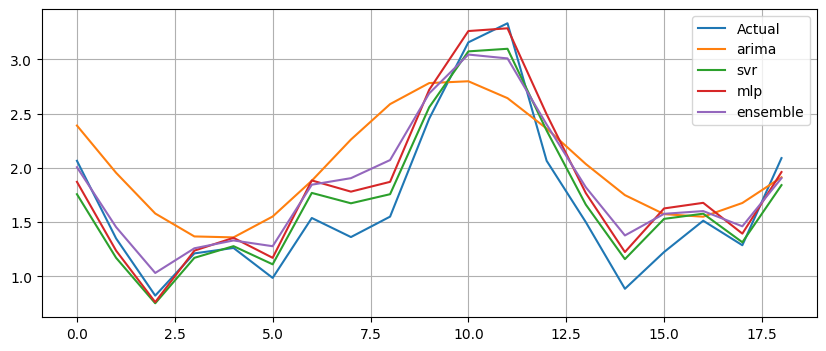

Generation 78: Fitness = 2.75337




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0493331831414243
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867228536046377
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.1690606116141424
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6857569922169056
SVRModel {'kernel': 'linear', 'c': 51.970879069290824, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 51.92334843260006, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 52.20443538208588, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'ker

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


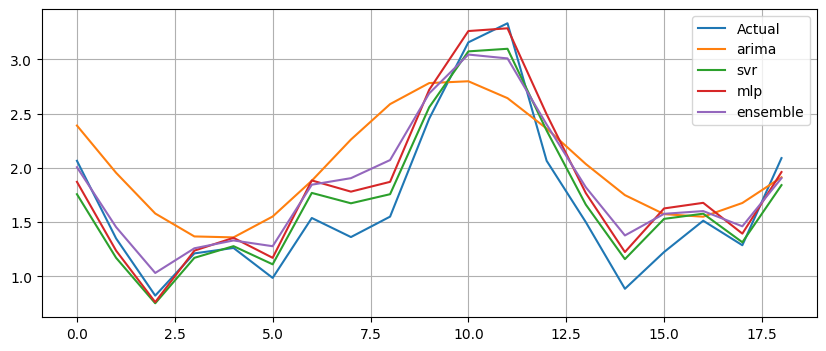

Generation 79: Fitness = 2.75337




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1344921127450054
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868744394487407
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.109095137749047
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 51.76536469437974, 'gamma': 'scale', 'epsilon': 0.4904210181486829} Fitness: 4.534739004642927
SVR

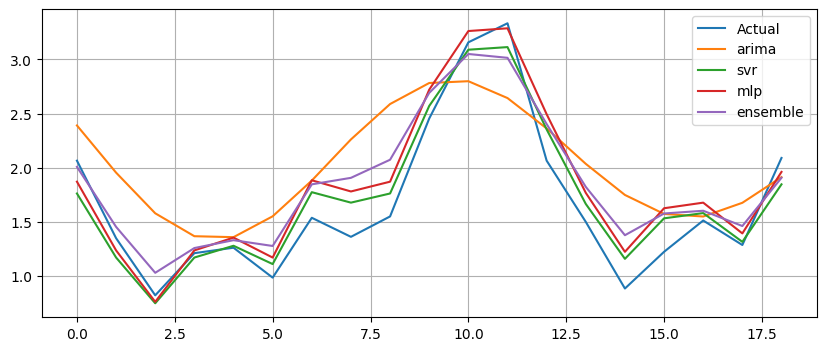

Generation 80: Fitness = 2.74916




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869646404339227
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0441114733789978
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1634968018501997
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869646404339227
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0494266288550973
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869646404339227
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867635986699956
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866710268124792
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869646404339227
SVRModel {'kernel': 'linear', 'c': 51.76536469437974, 'gamma': 'scale', 'epsilon': 0.4904210181486829} Fitness: 4.515791252896599
SVRModel {'kernel': 'linear', 'c': 52.1552696889844, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.557042146794853
SV

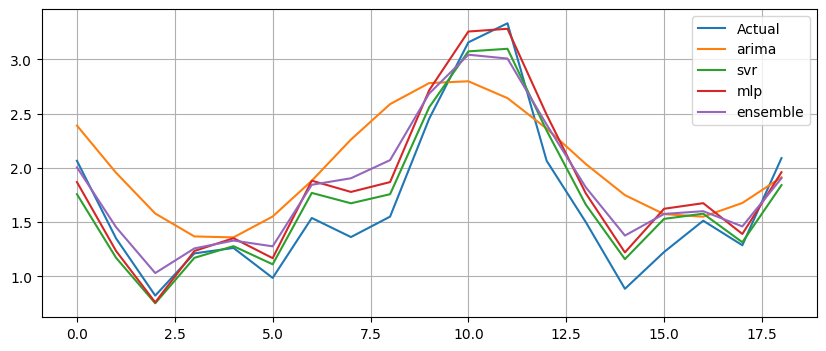

Generation 81: Fitness = 2.75866




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868712968331805
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869024471617085
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866060043663986
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867352778927063
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.1690606116141424
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687384911746531
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6938741084020228
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.52906961483921
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel': 'linear', 'c': 51.77245172791886, 'gamma': 'scale', 'epsilon': 0.49646474965994997} Fitness: 4.524801898555297
SVR

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


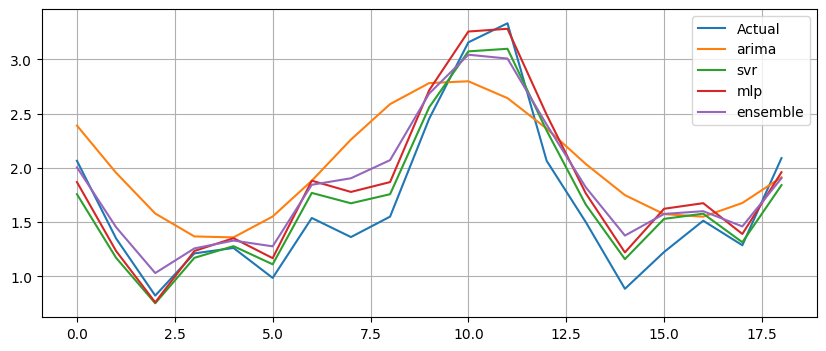

Generation 82: Fitness = 2.75866




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869794841527161
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868712968331805
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528975759325329
SVRModel {'kernel'

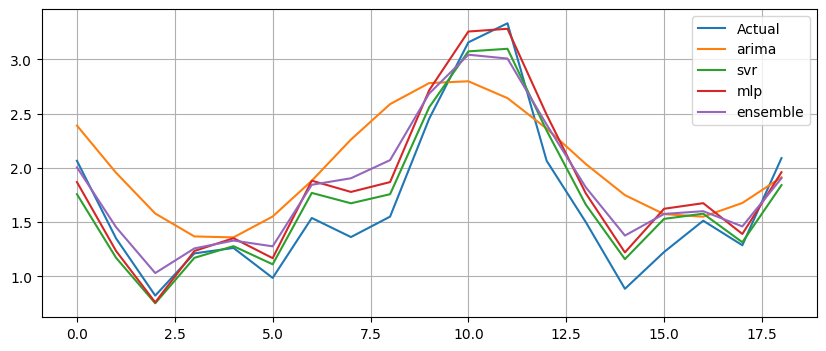

Generation 83: Fitness = 2.75866




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6962669880928283
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.684943160110671
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866113071668105
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6960230094567836
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.684976229201948
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
SVRModel {'kernel': 'rbf', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.4957381599445152
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.531368260330146
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.40324432493274853} Fitness: 3.5960315818903488
SVRMo

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


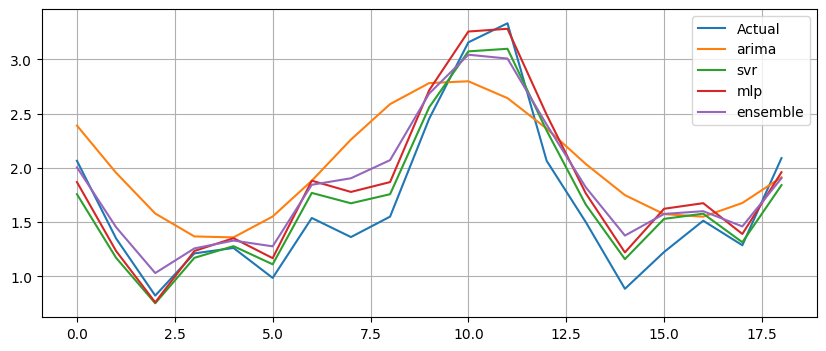

Generation 84: Fitness = 2.75866




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0494727240758146
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1345141851642846
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel'

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


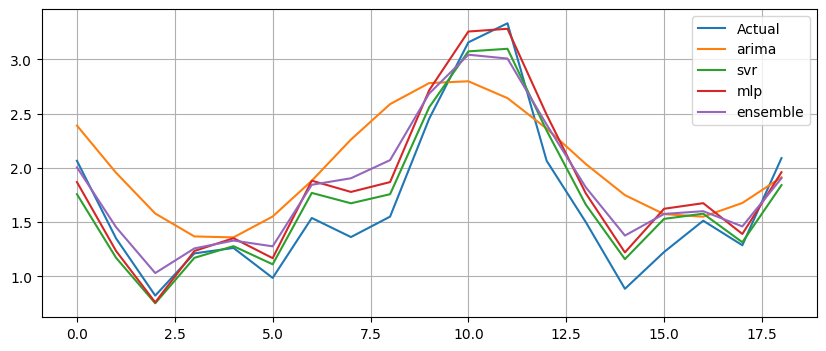

Generation 85: Fitness = 2.75866




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6381648322742712
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1091351096061954
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6892238427784672
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6875487463131877
SVRModel {'kernel': 'linear', 'c': 55.35737095128848, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529596176880627
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


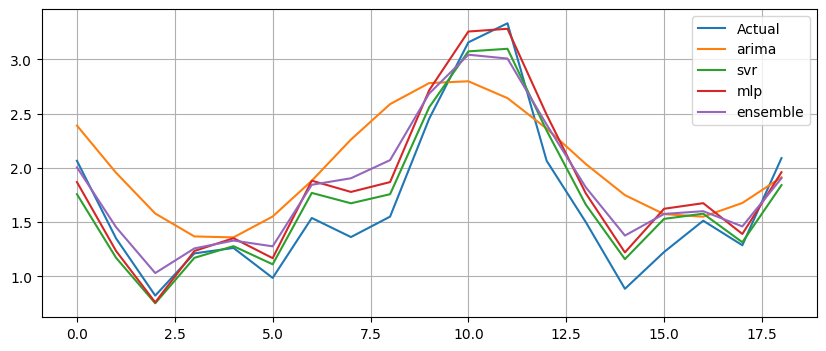

Generation 86: Fitness = 2.75866




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870364338794597
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6862104685527002
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686997670430866
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6964585345198309
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687691435540069
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5289249254648904
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.535476262466767
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel':

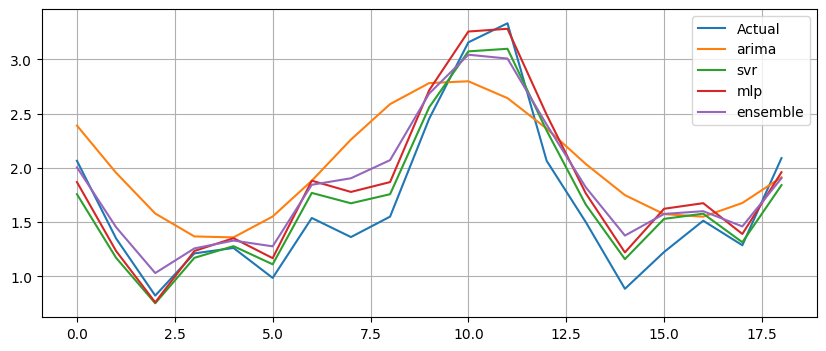

Generation 87: Fitness = 2.75866




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1632818353095677
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686987121769155
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1091351096061954
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel': 'linear', 'c': 52.510741315749755, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel

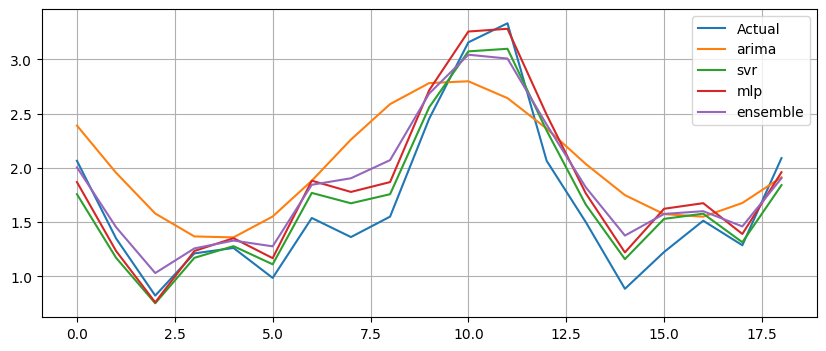

Generation 88: Fitness = 2.75866




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1091351096061954
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868425517018608
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0494266288550973
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869922889895317
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel': 'poly', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.1269294229865694
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529163532828545
SVRModel {'kernel':

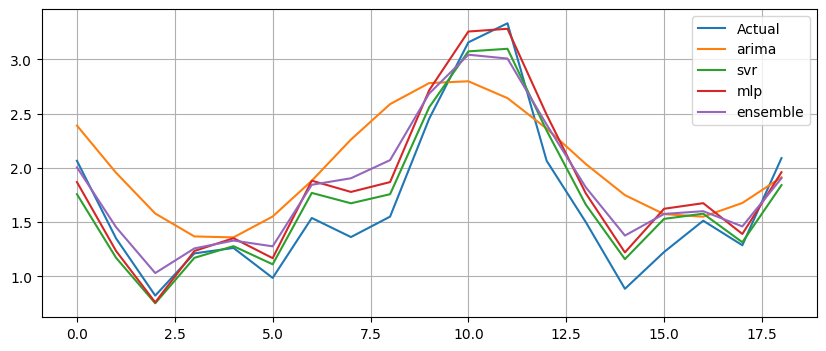

Generation 89: Fitness = 2.75866




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1091351096061954
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6980036098387925
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0486425549545417
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870130441601958
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6368149859075545
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6964585345198309
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel'

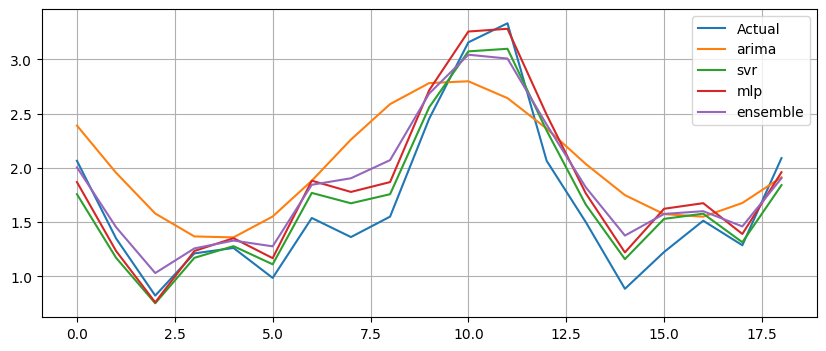

Generation 90: Fitness = 2.75866




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870897849777802
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6865888032158802
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6845875930185874
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869272580657877
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1092219533392047
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6282787018549882
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866255789768683
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528868617666792
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'linear', 'c': 51.7845507813789, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529804214029609
SVRModel {'kernel':

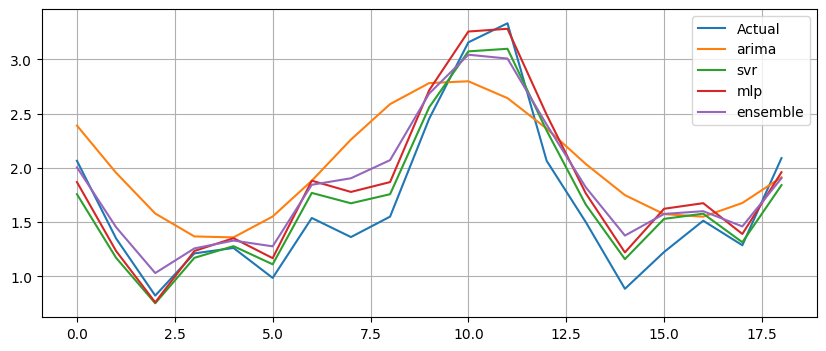

Generation 91: Fitness = 2.75866




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.6722803901057235
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685414734219545
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.1687643311043847
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869413044051373
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
SVRModel {'kernel': 'linear', 'c': 51.830849838292366, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel': 'linear', 'c': 51.34271302140424, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel': 'poly', 'c': 51.830849838292366, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.2276671978800309
SVRModel {'kernel

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


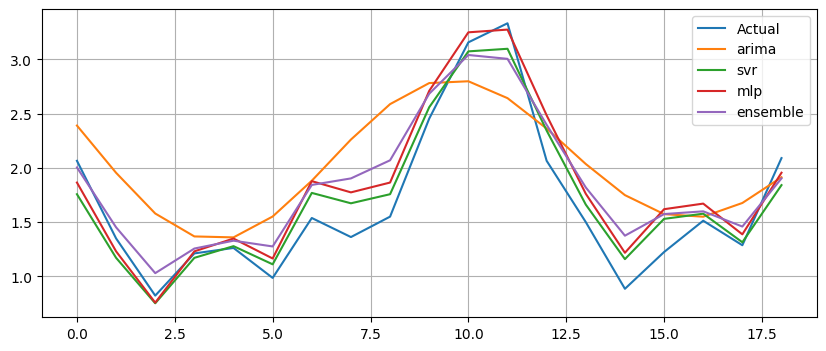

Generation 92: Fitness = 2.76552




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870260323699726
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.696202759124907
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6869413044051373
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
SVRModel {'kernel': 'linear', 'c': 54.70756118582137, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528936188478316
SVRModel {'kernel': 'rbf', 'c': 53.19211734640899, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.4960202245661613
SVRModel {'kernel': 'linear', 'c': 51.81239116096803, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'l

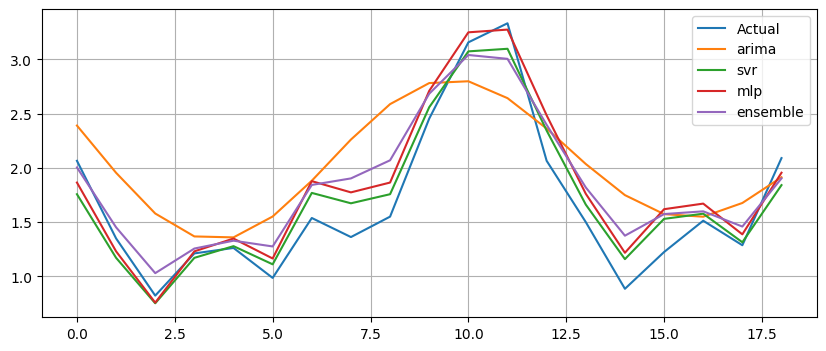

Generation 93: Fitness = 2.76552




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.684924110336618
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870194560098648
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6875016172229178
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.1691526284069929
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
SVRModel {'kernel': 'linear', 'c': 52.19993627964895, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.531266466296506
SVRModel {'kernel': 'linear', 'c': 52.56358456829245, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'linear', 'c': 53.82751650686889, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528942985522546
SVRModel {'kernel': '

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


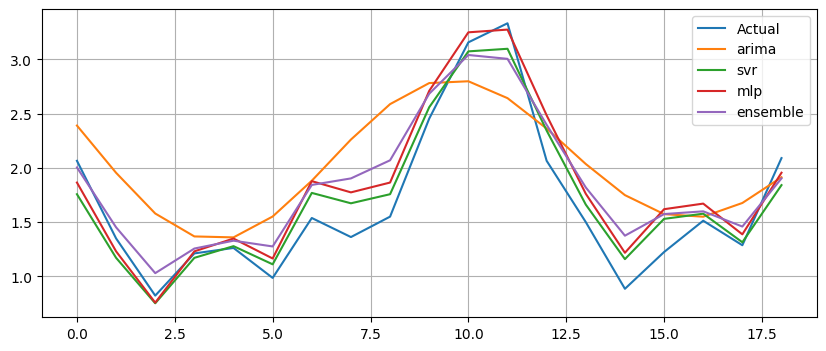

Generation 94: Fitness = 2.76552




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1537900434328414
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6842944649239064
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870468961138765
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6867473592884066
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6912344833333182
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
SVRModel {'kernel': 'linear', 'c': 52.19993627964895, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'linear', 'c': 51.81116654852144, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547323770084033
SVRModel {'kernel': 'linear', 'c': 51.81116654852144, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.538623884039866
SVRModel {'kernel': 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


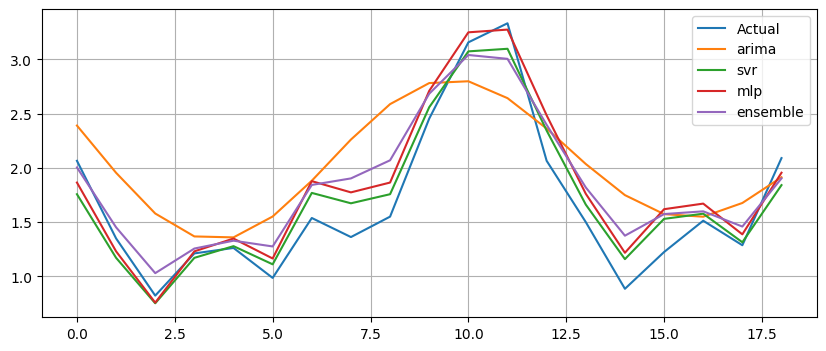

Generation 95: Fitness = 2.76552




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1345921359118902
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6878369609117643
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.638215611540668
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1090822989542857
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.638215611540668
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6965021169615924
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
SVRModel {'kernel': 'linear', 'c': 51.81116654852144, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547760765141988
SVRModel {'kernel': 'linear', 'c': 51.81116654852144, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.536897699143862
SVRModel {'kernel': 'linear', 'c': 51.81116654852144, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': '

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


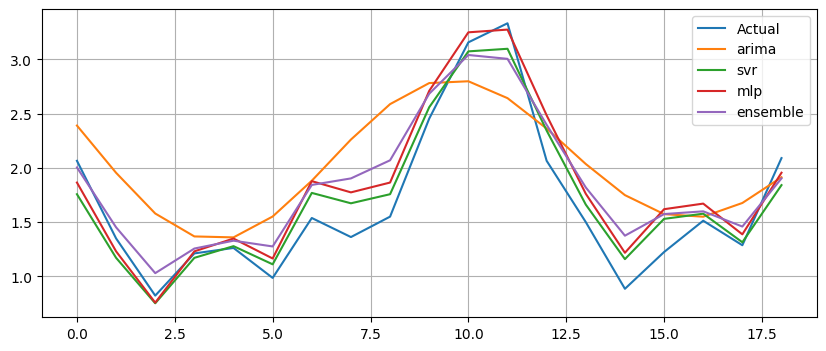

Generation 96: Fitness = 2.76552




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6965021169615924
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6863229926010606
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
SVRModel {'kernel': 'linear', 'c': 51.81116654852144, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'linear', 'c': 51.929646917427704, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'linear', 'c': 52.19993627964895, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'l

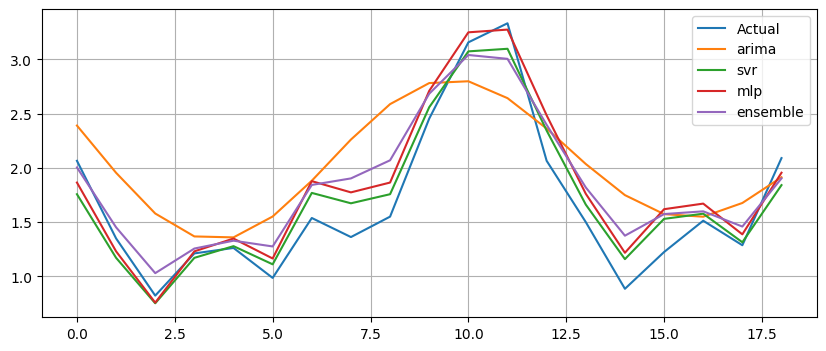

Generation 97: Fitness = 2.76552




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8680850821946624
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687031121286157
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
SVRModel {'kernel': 'linear', 'c': 51.81116654852144, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'linear', 'c': 51.81116654852144, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'linear', 'c': 52.19993627964895, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'lin

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


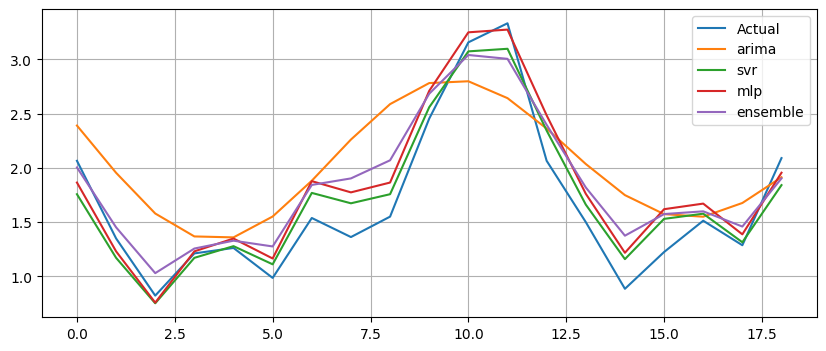

Generation 98: Fitness = 2.76552




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6848844542136128
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6283306994685167
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868086290700346
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6868213283403732
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
SVRModel {'kernel': 'linear', 'c': 58.32720243863033, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'linear', 'c': 51.81116654852144, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'linear', 'c': 51.81116654852144, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': '

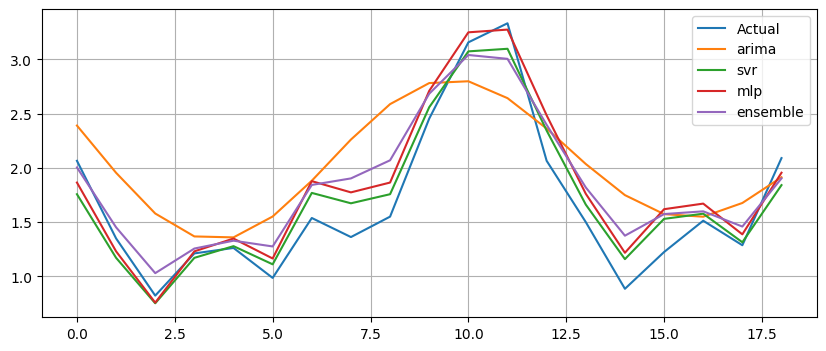

Generation 99: Fitness = 2.76552




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687052680015248
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.864446171605374
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.687063038451626
SVRModel {'kernel': 'linear', 'c': 51.81116654852144, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'linear', 'c': 51.81116654852144, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'linear', 'c': 51.94011313527014, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528894045460248
SVRModel {'kernel': 'line

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


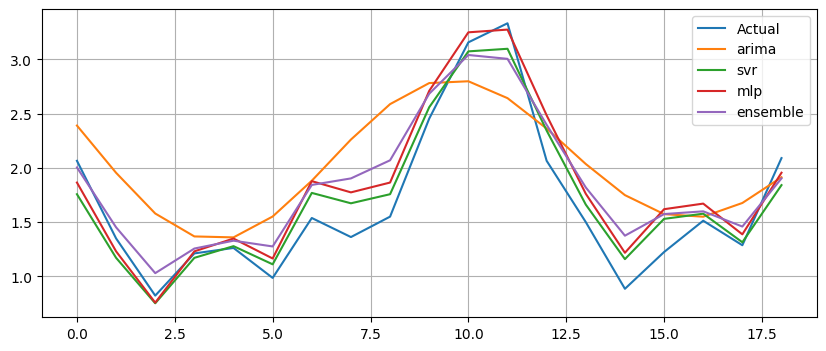

Generation 100: Fitness = 2.76552




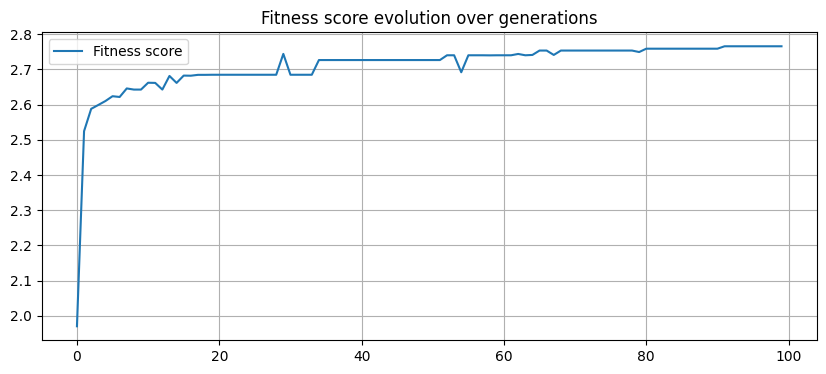

In [17]:
pool_of_models = [ArimaModel, SVRModel, MLPModel]
population_size = 10
num_generations = 100
mutation_rate = 0.2

print('Initializing population...')
population = init_population(population_size, pool_of_models)

print('Population created: ')
print_population(population)

fitness_score_collection = []

for generation in range(num_generations):

    # individual_evaluation(population, data)
    individual_evaluation_with_diversity(population, data)
    print_population(population)

    fitness_score, _, _, _ = team_evaluation(population, data['X_val_scaled'], data['y_val_scaled'])
    fitness_score_collection.append(fitness_score)

    print(f"Generation {generation + 1}: Fitness = {fitness_score:.5f}")
    print('=============================\n\n')

    # Selection by tournament
    selected_pop = tournament_selection(population)
    # print('selected population:')
    # print_population(selected_pop)

    # Crossover
    crossed_pop = crossover(selected_pop)
    # print('Crossed population:')
    # print_population(crossed_pop)
    
    # Mutation
    population = mutation(crossed_pop)
    # print_population(population)

plt.figure(figsize=(10, 4))
plt.plot(fitness_score_collection, label='Fitness score')
plt.title('Fitness score evolution over generations')
plt.grid()
plt.legend()
plt.show()

# Test